In [1]:
#SALİH CAN AYDOĞDU
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import InstanceHardnessThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from imblearn.pipeline import Pipeline
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from collections import Counter
from imblearn.over_sampling import SMOTE, ADASYN, SVMSMOTE, RandomOverSampler, BorderlineSMOTE
from imblearn.under_sampling import EditedNearestNeighbours, AllKNN, InstanceHardnessThreshold, NearMiss, NeighbourhoodCleaningRule, OneSidedSelection, RandomUnderSampler, TomekLinks
import numpy as np
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from matplotlib.table import Table
from prettytable import PrettyTable
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.preprocessing import StandardScaler
from keras.models import Sequential
from keras.layers import LSTM, Dense
from keras.regularizers import l1, l2
from keras.layers import LSTM, Dense, Dropout  # Add Dropout import
from keras.regularizers import l1  # Add l1 regularization import
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.optimizers import Adam
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE, ADASYN, SVMSMOTE, RandomOverSampler, BorderlineSMOTE
from imblearn.under_sampling import EditedNearestNeighbours, AllKNN, InstanceHardnessThreshold, NearMiss, NeighbourhoodCleaningRule, OneSidedSelection, RandomUnderSampler, TomekLinks
from collections import Counter
import pandas as pd
from lightgbm import LGBMClassifier
from keras.models import Sequential
from keras.layers import LSTM, Dropout, Dense
from keras.optimizers import Adam
from keras.regularizers import l1
from keras.callbacks import History
from tensorflow.keras.layers import GRU
from imblearn.over_sampling import KMeansSMOTE
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, GRU, Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from prettytable import PrettyTable
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import History
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from imblearn.metrics import classification_report_imbalanced
from imblearn.pipeline import make_pipeline
from prettytable import PrettyTable
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout
from keras.optimizers import Adam
from keras.regularizers import l1
from keras.callbacks import History
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

In [3]:
# Load Data
csv_file_path = "/content/drive/MyDrive/diabetes.csv"
data = pd.read_csv(csv_file_path)

# Basic statistical information of the data set
tanitim = data.describe()


print(tanitim)

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000      62.000000       0.000000    0.000000   
50%       3.000000  117.000000      72.000000      23.000000   30.500000   
75%       6.000000  140.250000      80.000000      32.000000  127.250000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    31.992578                  0.471876   33.240885    0.348958  
std      7.884160                  0.331329   11.760232    0.476951  
min      0.000000                  

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


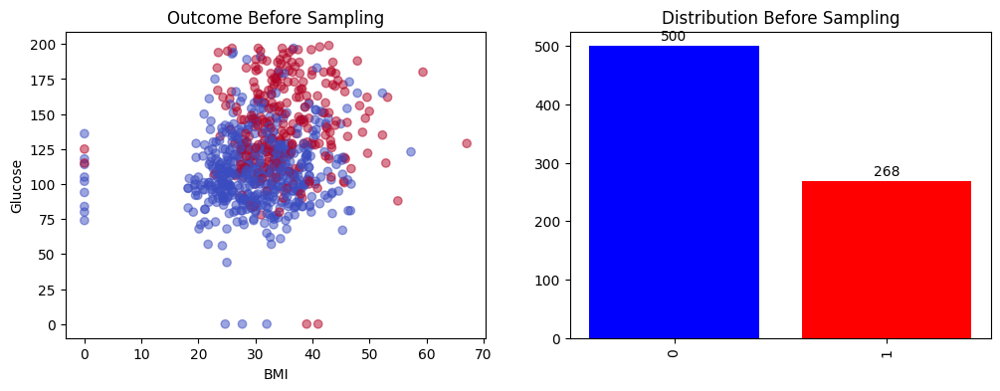

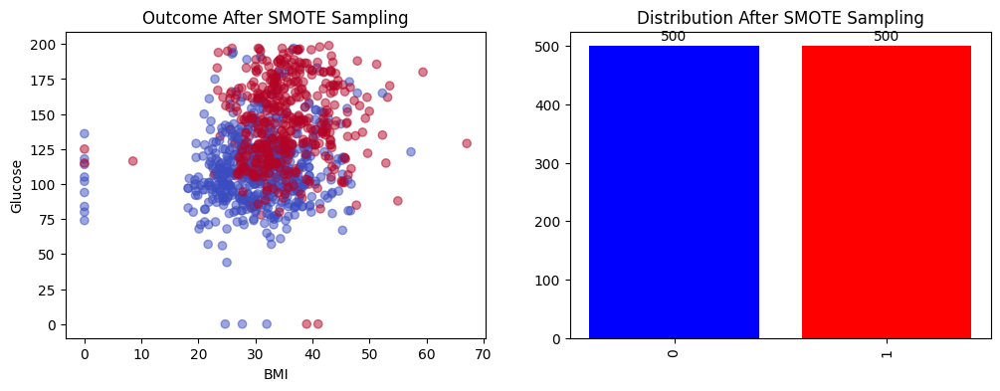

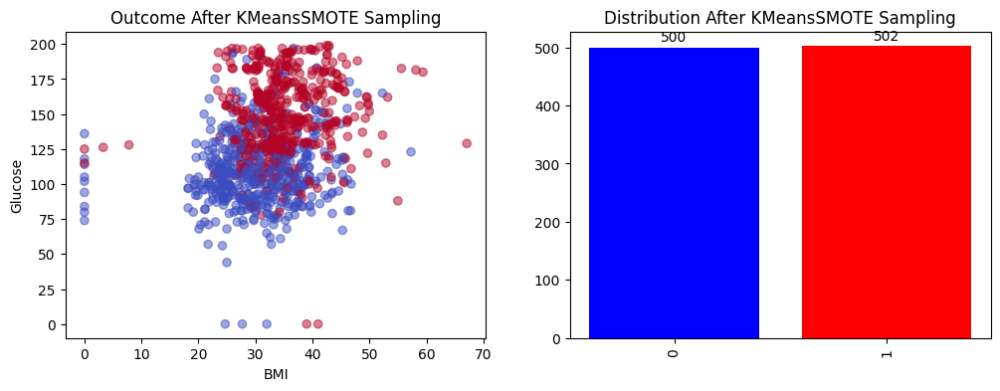

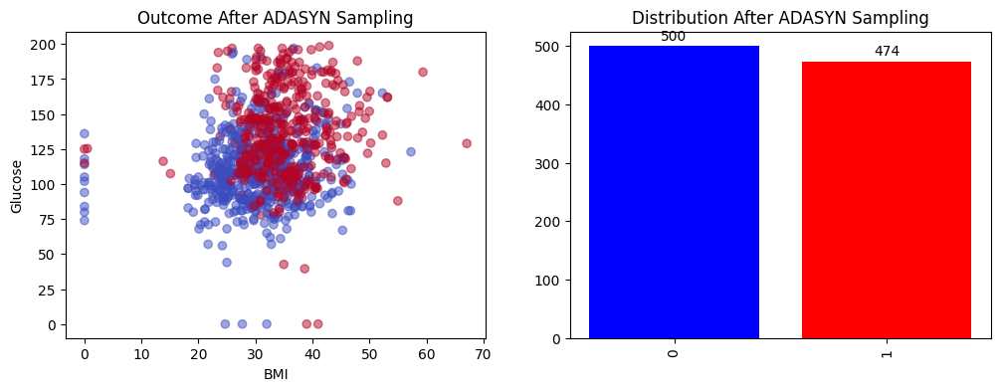

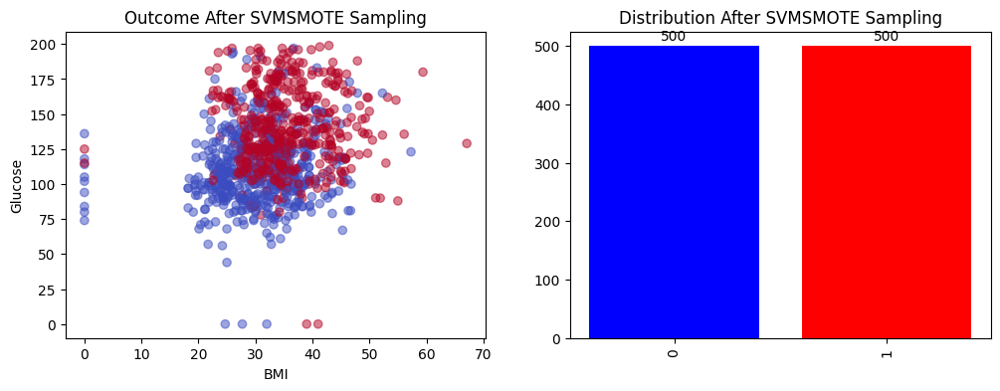

...

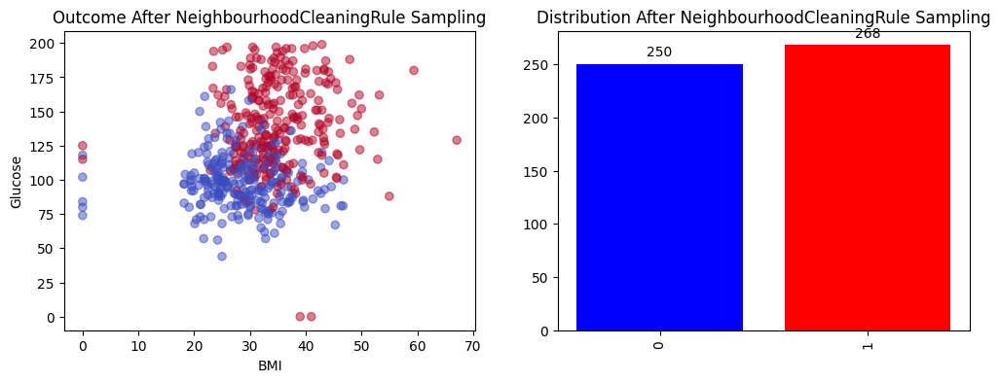

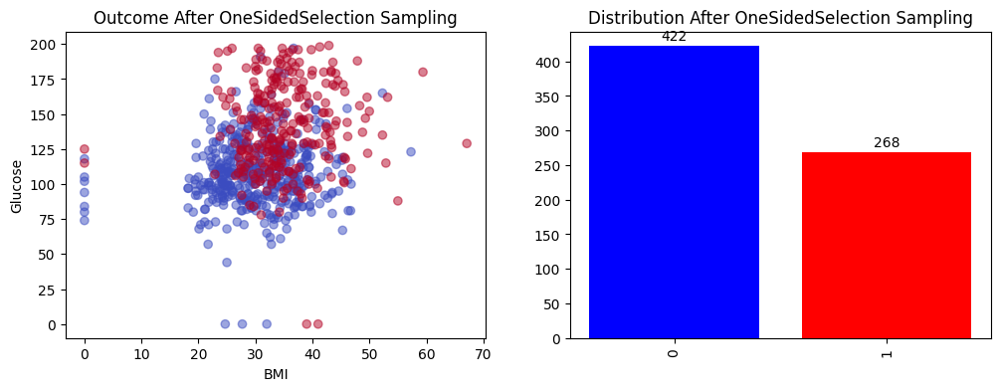

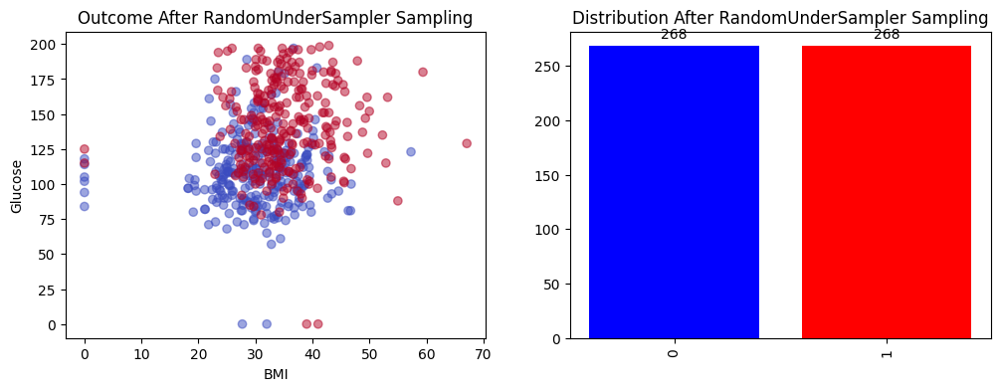

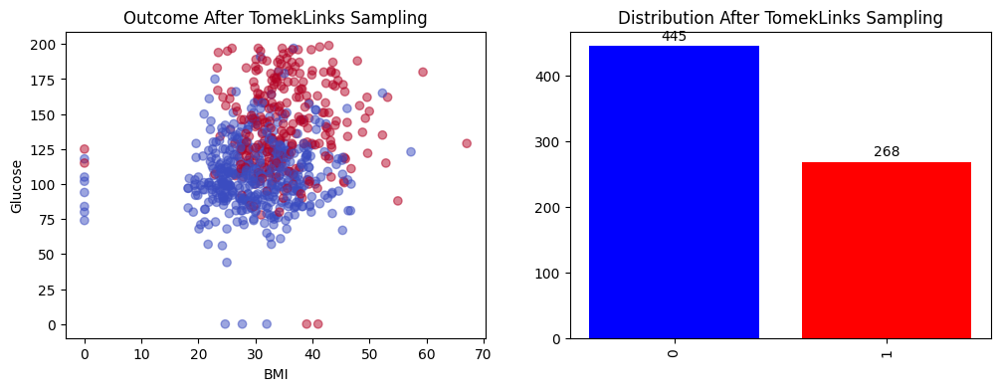

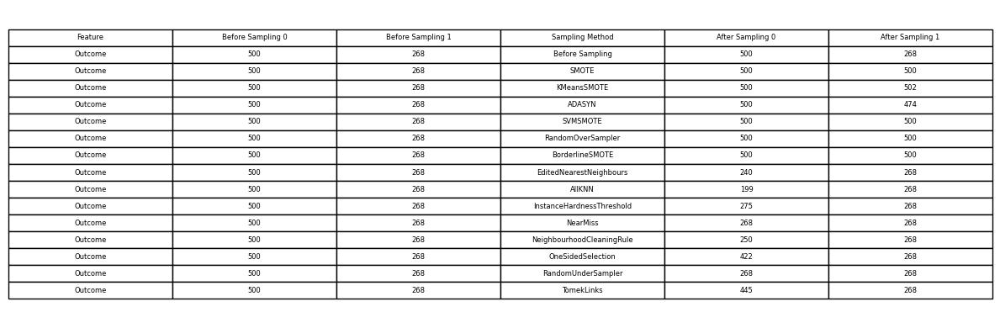

In [4]:
def show_the_distribution(X, y, oversamplers=None, undersamplers=None):
    # Calculate class distribution before sampling
    before_sampling_counts = Counter(y)

    # Create a list to store data for all sampling methods
    table_data_list = []

    # Extract features and target variable
    X = data.drop(['Outcome'], axis=1).values
    y = data['Outcome'].values

    # Show "before sampling" distributions only once
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.scatter(X[:, 5], X[:, 1], c=y, cmap='coolwarm', alpha=0.5)
    plt.title('Outcome Before Sampling')
    plt.xlabel('BMI')
    plt.ylabel('Glucose')

    plt.subplot(1, 2, 2)
    plt.bar(['0', '1'], [before_sampling_counts[0], before_sampling_counts[1]], color=['blue', 'red'])
    plt.text(0, before_sampling_counts[0] + 5, str(before_sampling_counts[0]), ha='center', va='bottom', fontsize=10)
    plt.text(1, before_sampling_counts[1] + 5, str(before_sampling_counts[1]), ha='center', va='bottom', fontsize=10)
    plt.title('Distribution Before Sampling')
    plt.xticks(rotation='vertical')
    plt.tick_params(axis='both', which='major', labelsize=10)

    # Append data for "before sampling" to the list
    table_data_list.append({
        'Feature': 'Outcome',
        'Before Sampling 0': before_sampling_counts[0],
        'Before Sampling 1': before_sampling_counts[1],
        'Sampling Method': 'Before Sampling',
        'After Sampling 0': before_sampling_counts[0],
        'After Sampling 1': before_sampling_counts[1]
    })

    # Train and evaluate for each oversampler
    if oversamplers:
        for oversampler in oversamplers:
            X_resampled, y_resampled = oversampler.fit_resample(X, y)
            process_sampling_method(X_resampled, y_resampled, oversampler, table_data_list)

    # Train and evaluate for each undersampler
    if undersamplers:
        for undersampler in undersamplers:
            X_resampled, y_resampled = undersampler.fit_resample(X, y)
            process_sampling_method(X_resampled, y_resampled, undersampler, table_data_list)

    # Create a single table with all the data
    df = pd.DataFrame(table_data_list)
    plt.figure(figsize=(12, 4))
    plt.axis('off')
    plt.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')
    plt.tight_layout()
    plt.show()


def process_sampling_method(X_resampled, y_resampled, sampler, table_data_list):
    sampler_name = type(sampler).__name__
    after_sampling_counts = Counter(y_resampled)

    # Append data for the current sampling method to the list
    table_data_list.append({
        'Feature': 'Outcome',
        'Before Sampling 0': 500,
        'Before Sampling 1': 268,
        'Sampling Method': sampler_name,
        'After Sampling 0': after_sampling_counts[0],
        'After Sampling 1': after_sampling_counts[1]
    })

    # Create a new figure for after sampling distribution
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.scatter(X_resampled[:, 5], X_resampled[:, 1], c=y_resampled, cmap='coolwarm', alpha=0.5)
    plt.title(f'Outcome After {sampler_name} Sampling')
    plt.xlabel('BMI')
    plt.ylabel('Glucose')

    plt.subplot(1, 2, 2)
    plt.bar(['0', '1'], [after_sampling_counts[0], after_sampling_counts[1]], color=['blue', 'red'])
    plt.text(0, after_sampling_counts[0] + 5, str(after_sampling_counts[0]), ha='center', va='bottom', fontsize=10)
    plt.text(1, after_sampling_counts[1] + 5, str(after_sampling_counts[1]), ha='center', va='bottom', fontsize=10)
    plt.title(f'Distribution After {sampler_name} Sampling')
    plt.xticks(rotation='vertical')
    plt.tick_params(axis='both', which='major', labelsize=10)


# Extract features and target variable
X = data.drop(['Outcome'], axis=1).values
y = data['Outcome'].values

# Oversampling methods
oversamplers = [SMOTE(random_state=42), KMeansSMOTE(random_state=42), ADASYN(random_state=42), SVMSMOTE(random_state=42),
                RandomOverSampler(random_state=42), BorderlineSMOTE(random_state=42)]

# Undersampling methods
undersamplers = [EditedNearestNeighbours(), AllKNN(), InstanceHardnessThreshold(random_state=42),
                 NearMiss(), NeighbourhoodCleaningRule(), OneSidedSelection(random_state=42),
                 RandomUnderSampler(random_state=42), TomekLinks()]

# Train and evaluate for each oversampler and undersampler
show_the_distribution(X, y, oversamplers=oversamplers, undersamplers=undersamplers)

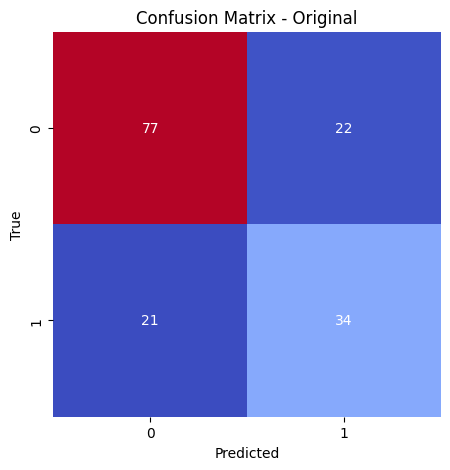

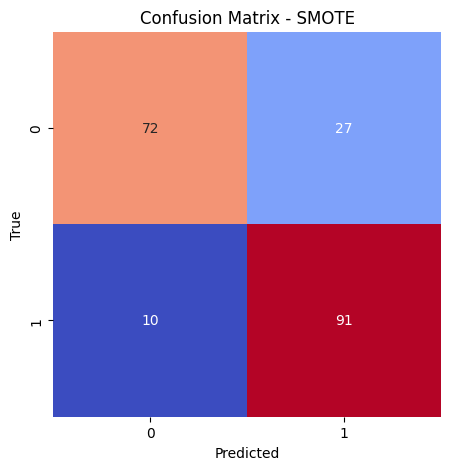

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


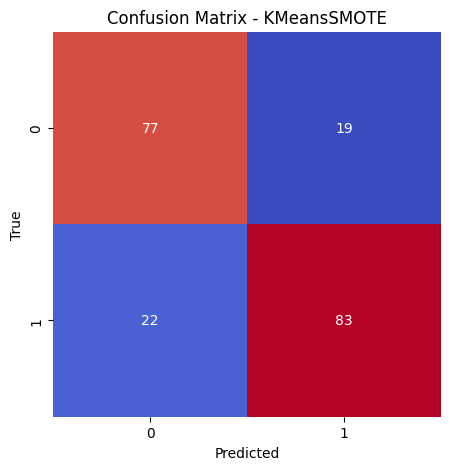

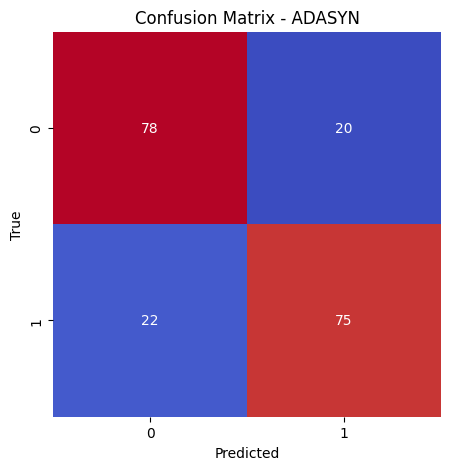

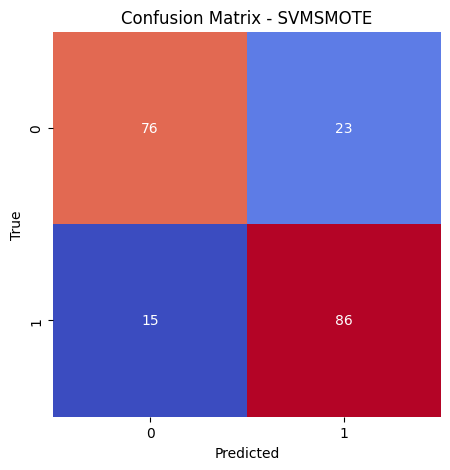

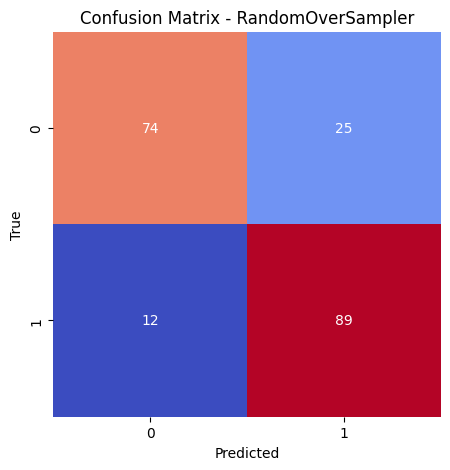

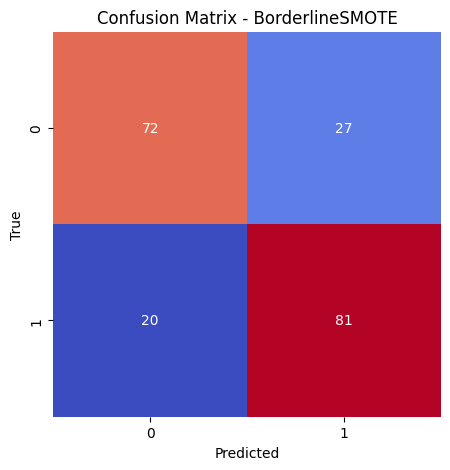

...

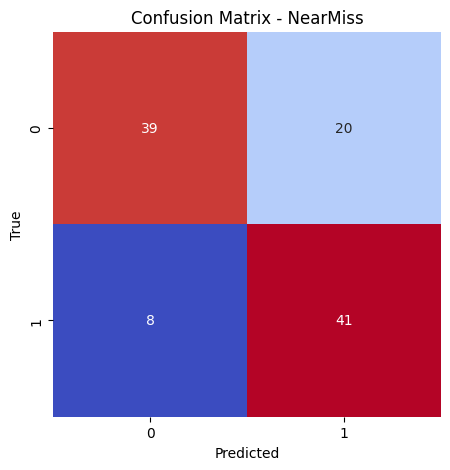

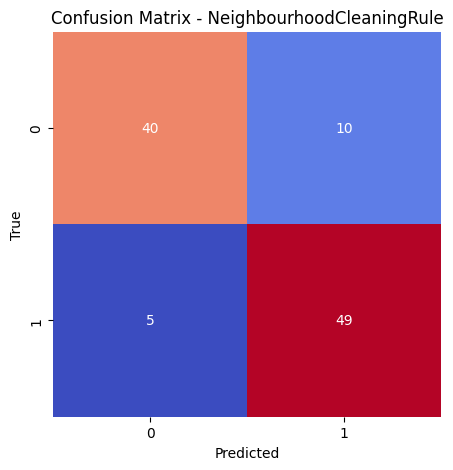

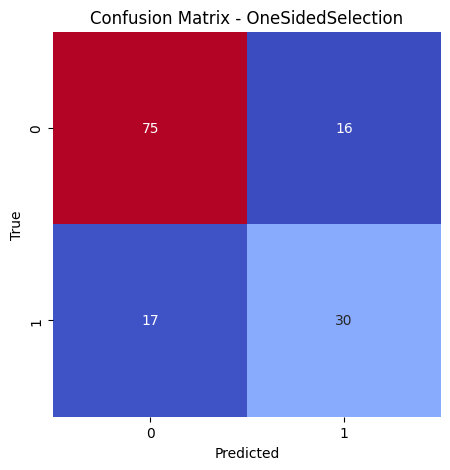

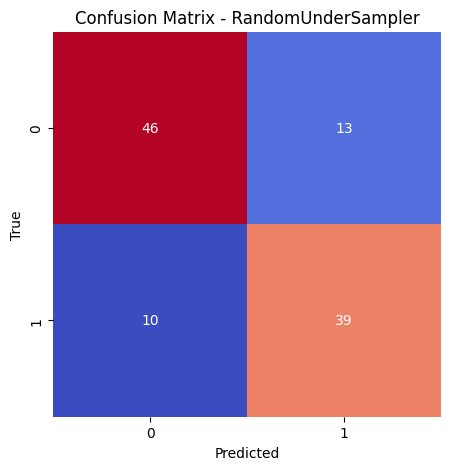

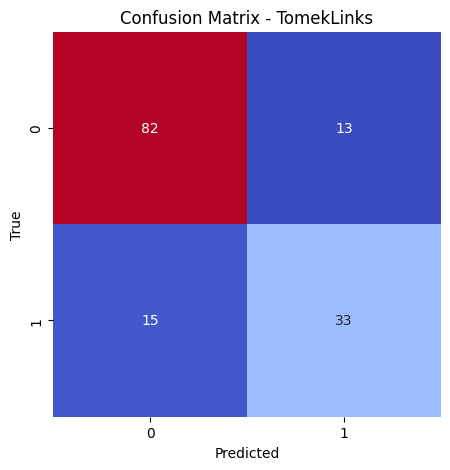

+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7207792207792207 | 0.6071428571428571 | 0.6181818181818182 | 0.6126126126126126 |
|           SMOTE           |       0.815        | 0.7711864406779662 | 0.900990099009901  | 0.8310502283105023 |
|        KMeansSMOTE        | 0.7960199004975125 | 0.8137254901960784 | 0.7904761904761904 | 0.8019323671497584 |
|           ADASYN          | 0.7846153846153846 | 0.7894736842105263 | 0.7731958762886598 |      0.78125       |
|          SVMSMOTE         |        0.81        | 0.7889908256880734 | 0.8514851485148515 | 0.819047619047619  |
|     RandomOverSampler     |       0.815        | 0.7807017543859649 | 0.88118811881188

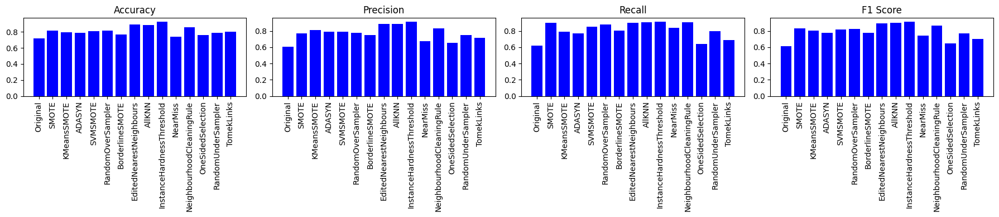

In [ ]:
#RandomForest
def plot_metrics_comparison_random_forest(X, y, samplers):
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    # Original dataset
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X, y, test_size=0.2, random_state=42)
    rf_model_orig = RandomForestClassifier(random_state=42)
    rf_model_orig.fit(X_train_orig, y_train_orig)
    y_pred_orig = rf_model_orig.predict(X_test_orig)

    accuracy_orig = accuracy_score(y_test_orig, y_pred_orig)
    precision_orig = precision_score(y_test_orig, y_pred_orig)
    recall_orig = recall_score(y_test_orig, y_pred_orig)
    f1_orig = f1_score(y_test_orig, y_pred_orig)

    metrics_values['Accuracy'].append(accuracy_orig)
    metrics_values['Precision'].append(precision_orig)
    metrics_values['Recall'].append(recall_orig)
    metrics_values['F1 Score'].append(f1_orig)

    # Confusion Matrix for Original dataset
    cm_orig = confusion_matrix(y_test_orig, y_pred_orig)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm_orig, annot=True, fmt='d', cmap='coolwarm', cbar=False)
    plt.title('Confusion Matrix - Original')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    for sampler in samplers:
        X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

        rf_model = RandomForestClassifier(random_state=42)
        rf_model.fit(X_train, y_train)
        y_pred = rf_model.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Confusion Matrix for Resampled dataset
        cm_resampled = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5, 5))
        sns.heatmap(cm_resampled, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler.__class__.__name__}')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Create a PrettyTable
    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for sampler, accuracy, precision, recall, f1 in zip(['Original'] + [sampler.__class__.__name__ for sampler in samplers],
                                                      metrics_values['Accuracy'], metrics_values['Precision'],
                                                      metrics_values['Recall'], metrics_values['F1 Score']):
        table.add_row([sampler, accuracy, precision, recall, f1])

    print(table)

    # Plot for each metric
    plt.figure(figsize=(18, 4))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(1, 4, i)
        plt.bar(['Original'] + [sampler.__class__.__name__ for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()


plot_metrics_comparison_random_forest(X, y, oversamplers + undersamplers)

In [ ]:
#--------------->PIPELINE SAMPLING??<--------------


Training and Evaluating with SMOTE + InstanceHardnessThreshold:

Accuracy: 0.76
Precision: 0.64
Recall: 0.75
F1 Score: 0.69


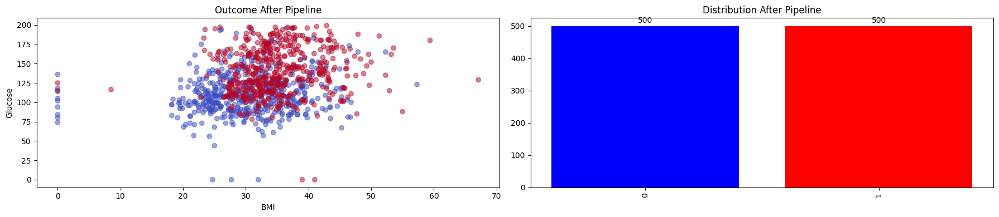

In [ ]:
# Define the samplers and classifier
over_sampler = SMOTE(random_state=42)
under_sampler = InstanceHardnessThreshold(
    estimator=RandomForestClassifier(random_state=42, class_weight='balanced'),
    sampling_strategy='majority',
    random_state=42
)

# Define the classifier for the final model
classifier = RandomForestClassifier(random_state=42, class_weight='balanced')


# Create a pipeline with both over-sampling (SMOTE) and under-sampling (InstanceHardnessThreshold)
pipeline = Pipeline([
    ('over_sampler', over_sampler),
    ('under_sampler', under_sampler),
    ('classifier', classifier)
])


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Fit the pipeline on the training data
pipeline.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = pipeline.predict(X_test)

# Evaluate the performance
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("\nTraining and Evaluating with SMOTE + InstanceHardnessThreshold:\n")
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

# Additional Metrics Plots
metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
metrics_values = [accuracy, precision, recall, f1]

# Plot class distribution before and after sampling
plt.figure(figsize=(18, 4))
"""
 Plot class distribution before the entire pipeline
plt.subplot(1, 4, 1)
plt.scatter(X[:, 5], X[:, 1], c=y, cmap='coolwarm', alpha=0.5)
plt.title('Outcome Before Pipeline')
plt.xlabel('BMI')
plt.ylabel('Glucose')
"""
# Plot class distribution after the entire pipeline
plt.subplot(1, 2, 1)
X_resampled, y_resampled = over_sampler.fit_resample(X, y)
X_resampled, y_resampled = under_sampler.fit_resample(X_resampled, y_resampled)
plt.scatter(X_resampled[:, 5], X_resampled[:, 1], c=y_resampled, cmap='coolwarm', alpha=0.5)
plt.title('Outcome After Pipeline')
plt.xlabel('BMI')
plt.ylabel('Glucose')
"""
# Plot class distribution before sampling
plt.subplot(1, 3, 2)
before_sampling_counts = Counter(y)
plt.bar(['0', '1'], [before_sampling_counts[0], before_sampling_counts[1]], color=['blue', 'red'])
plt.text(0, before_sampling_counts[0] + 5, str(before_sampling_counts[0]), ha='center', va='bottom', fontsize=10)
plt.text(1, before_sampling_counts[1] + 5, str(before_sampling_counts[1]), ha='center', va='bottom', fontsize=10)
plt.title('Distribution Before Pipeline')
plt.xticks(rotation='vertical')
plt.tick_params(axis='both', which='major', labelsize=10)
"""
# Plot class distribution after sampling
plt.subplot(1, 2, 2)
after_sampling_counts = Counter(y_resampled)
plt.bar(['0', '1'], [after_sampling_counts[0], after_sampling_counts[1]], color=['blue', 'red'])
plt.text(0, after_sampling_counts[0] + 5, str(after_sampling_counts[0]), ha='center', va='bottom', fontsize=10)
plt.text(1, after_sampling_counts[1] + 5, str(after_sampling_counts[1]), ha='center', va='bottom', fontsize=10)
plt.title('Distribution After Pipeline')
plt.xticks(rotation='vertical')
plt.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.show()



In [ ]:
#knn
def plot_metrics_comparison_knn(X, y, samplers):
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    # Original dataset
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X, y, test_size=0.2, random_state=42)
    knn_model_orig = KNeighborsClassifier()
    knn_model_orig.fit(X_train_orig, y_train_orig)
    y_pred_orig = knn_model_orig.predict(X_test_orig)

    accuracy_orig = accuracy_score(y_test_orig, y_pred_orig)
    precision_orig = precision_score(y_test_orig, y_pred_orig)
    recall_orig = recall_score(y_test_orig, y_pred_orig)
    f1_orig = f1_score(y_test_orig, y_pred_orig)

    metrics_values['Accuracy'].append(accuracy_orig)
    metrics_values['Precision'].append(precision_orig)
    metrics_values['Recall'].append(recall_orig)
    metrics_values['F1 Score'].append(f1_orig)

    # Confusion Matrix for Original dataset
    cm_orig = confusion_matrix(y_test_orig, y_pred_orig)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm_orig, annot=True, fmt='d', cmap='coolwarm', cbar=False)
    plt.title('Confusion Matrix - Original')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    for sampler in samplers:
        X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

        knn_model = KNeighborsClassifier()
        knn_model.fit(X_train, y_train)
        y_pred = knn_model.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Confusion Matrix for Resampled dataset
        cm_resampled = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5, 5))
        sns.heatmap(cm_resampled, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler.__class__.__name__}')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Create a PrettyTable
    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for sampler, accuracy, precision, recall, f1 in zip(['Original'] + [sampler.__class__.__name__ for sampler in samplers],
                                                      metrics_values['Accuracy'], metrics_values['Precision'],
                                                      metrics_values['Recall'], metrics_values['F1 Score']):
        table.add_row([sampler, accuracy, precision, recall, f1])

    print(table)

    # Plot for each metric
    plt.figure(figsize=(18, 4))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(1, 4, i)
        plt.bar(['Original'] + [sampler.__class__.__name__ for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()

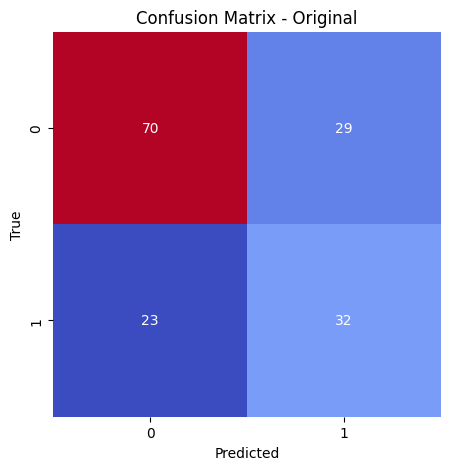

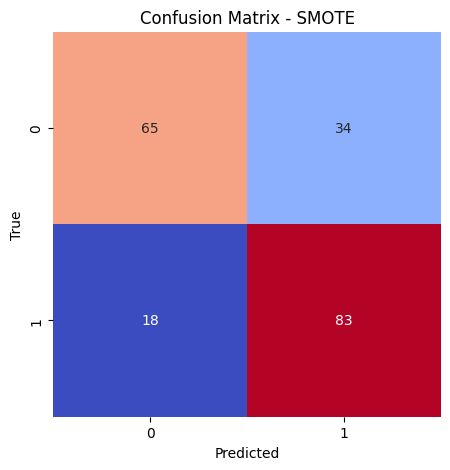

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


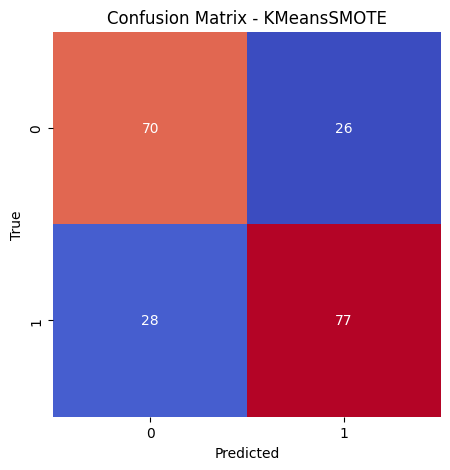

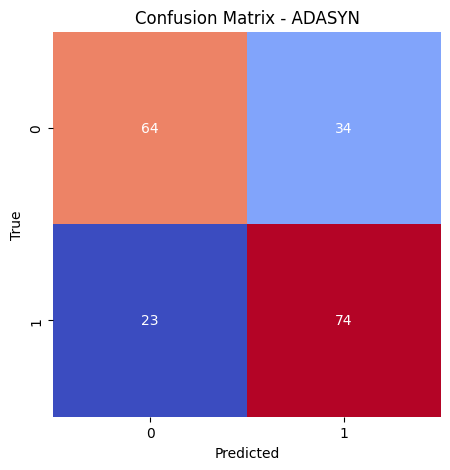

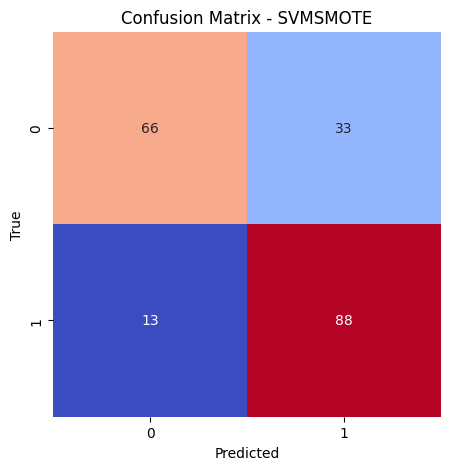

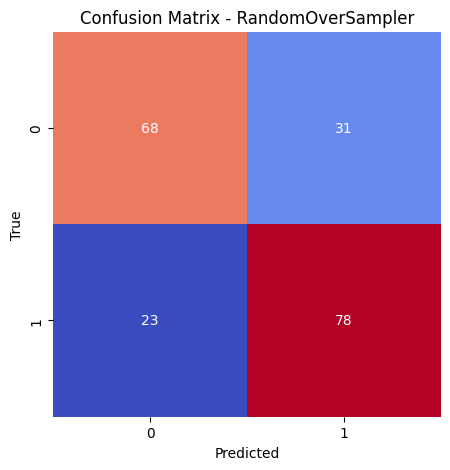

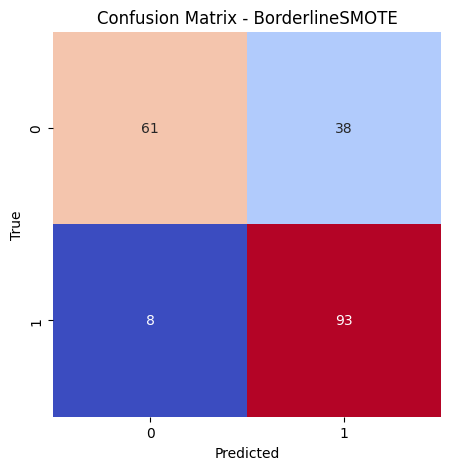

...

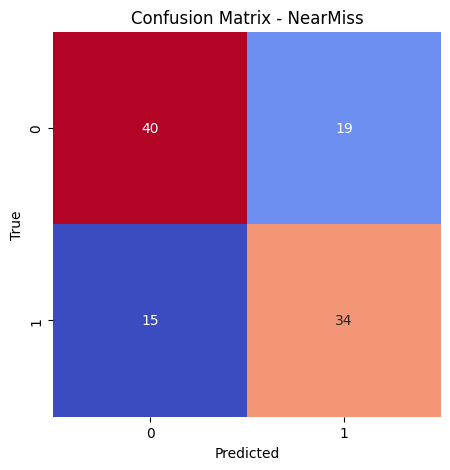

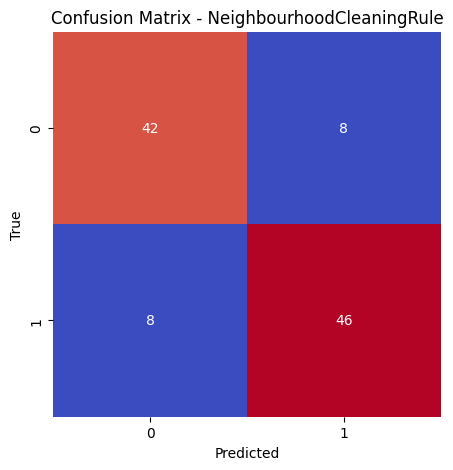

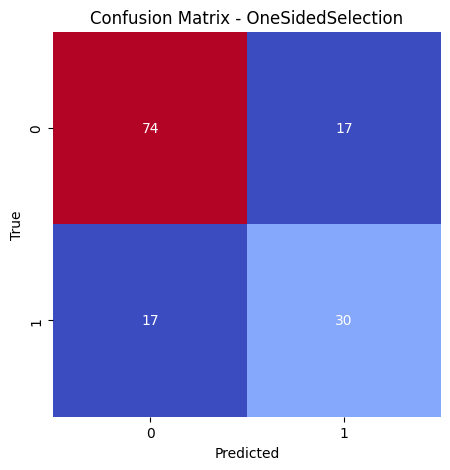

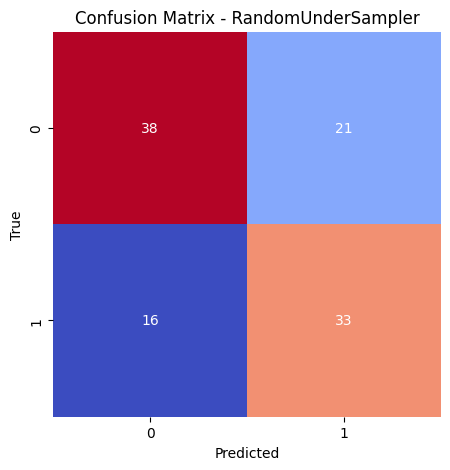

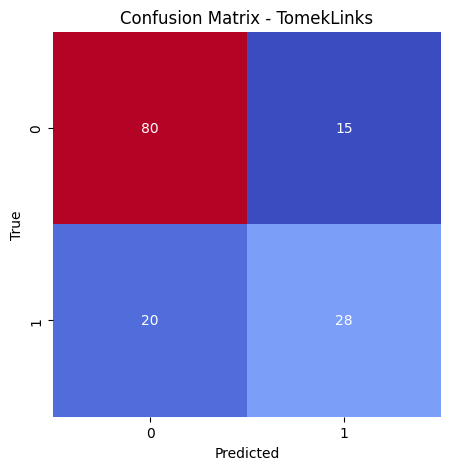

+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.6623376623376623 | 0.5245901639344263 | 0.5818181818181818 | 0.5517241379310346 |
|           SMOTE           |        0.74        | 0.7094017094017094 | 0.8217821782178217 | 0.761467889908257  |
|        KMeansSMOTE        | 0.7313432835820896 | 0.7475728155339806 | 0.7333333333333333 | 0.7403846153846153 |
|           ADASYN          | 0.7076923076923077 | 0.6851851851851852 | 0.7628865979381443 | 0.7219512195121952 |
|          SVMSMOTE         |        0.77        | 0.7272727272727273 | 0.8712871287128713 | 0.7927927927927927 |
|     RandomOverSampler     |        0.73        | 0.7155963302752294 | 0.77227722772277

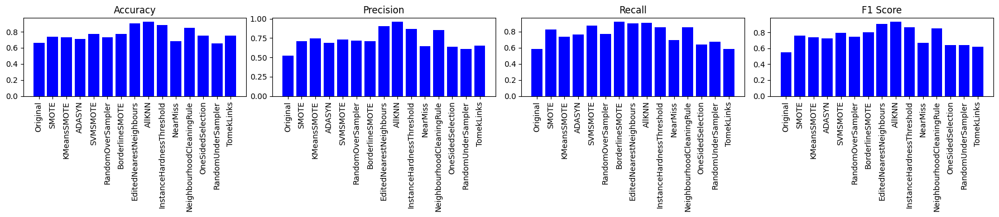

In [ ]:
plot_metrics_comparison_knn(X, y, oversamplers + undersamplers)

In [ ]:
#xgboost
def plot_metrics_comparison_xgboost(X, y, samplers):
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    # Original dataset
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X, y, test_size=0.2, random_state=42)
    xgb_model_orig = XGBClassifier(random_state=42)
    xgb_model_orig.fit(X_train_orig, y_train_orig)
    y_pred_orig = xgb_model_orig.predict(X_test_orig)

    accuracy_orig = accuracy_score(y_test_orig, y_pred_orig)
    precision_orig = precision_score(y_test_orig, y_pred_orig)
    recall_orig = recall_score(y_test_orig, y_pred_orig)
    f1_orig = f1_score(y_test_orig, y_pred_orig)

    metrics_values['Accuracy'].append(accuracy_orig)
    metrics_values['Precision'].append(precision_orig)
    metrics_values['Recall'].append(recall_orig)
    metrics_values['F1 Score'].append(f1_orig)

    # Confusion Matrix for Original dataset
    cm_orig = confusion_matrix(y_test_orig, y_pred_orig)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm_orig, annot=True, fmt='d', cmap='coolwarm', cbar=False)
    plt.title('Confusion Matrix - Original')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    for sampler in samplers:
        X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

        xgb_model = XGBClassifier(random_state=42)
        xgb_model.fit(X_train, y_train)
        y_pred = xgb_model.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Confusion Matrix for Resampled dataset
        cm_resampled = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5, 5))
        sns.heatmap(cm_resampled, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler.__class__.__name__}')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Create a PrettyTable
    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for sampler, accuracy, precision, recall, f1 in zip(['Original'] + [sampler.__class__.__name__ for sampler in samplers],
                                                      metrics_values['Accuracy'], metrics_values['Precision'],
                                                      metrics_values['Recall'], metrics_values['F1 Score']):
        table.add_row([sampler, accuracy, precision, recall, f1])

    print(table)

    # Plot for each metric
    plt.figure(figsize=(18, 4))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(1, 4, i)
        plt.bar(['Original'] + [sampler.__class__.__name__ for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()

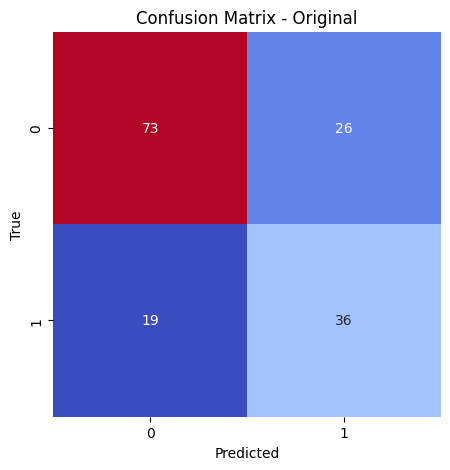

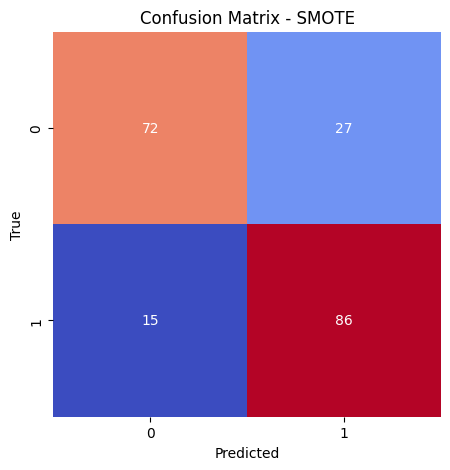

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


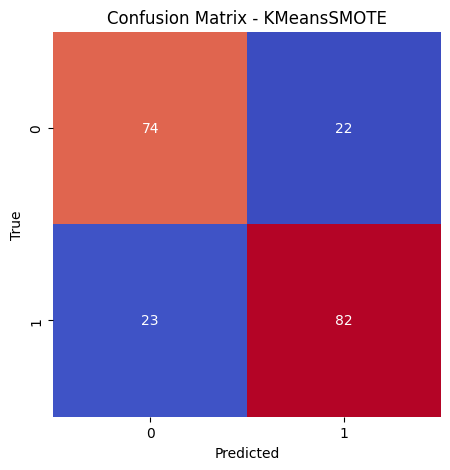

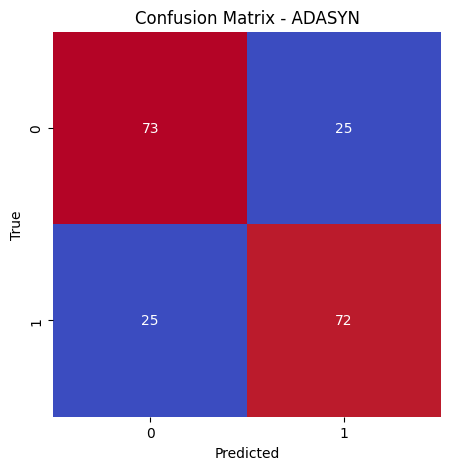

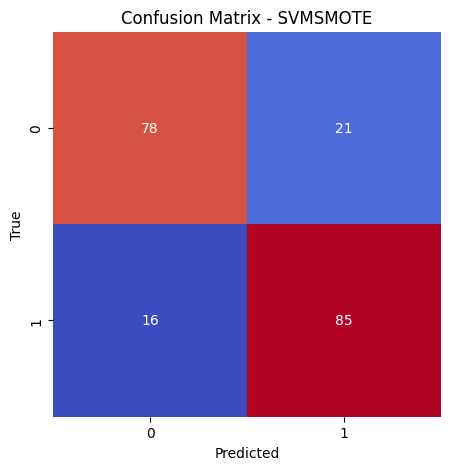

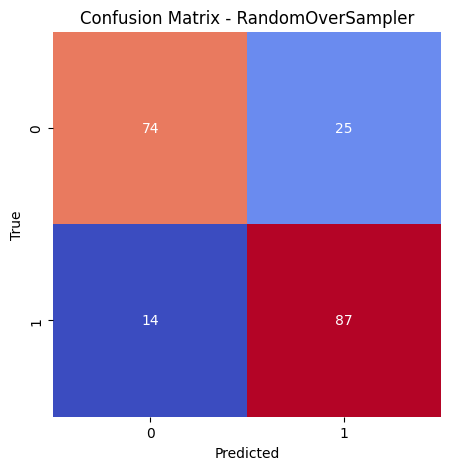

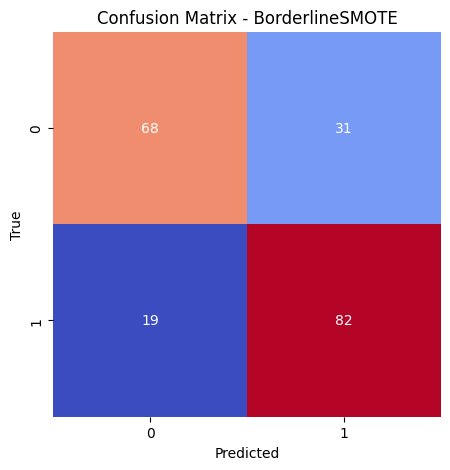

...

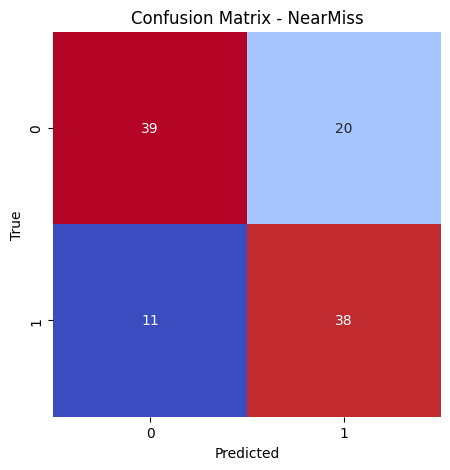

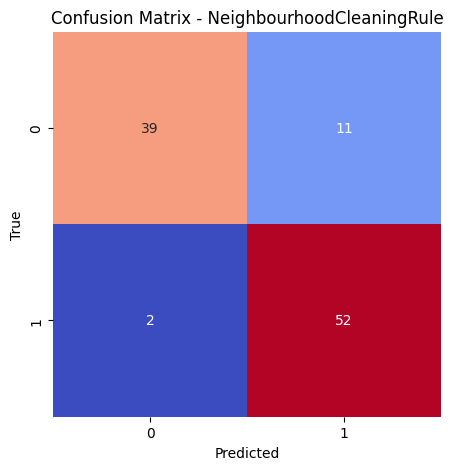

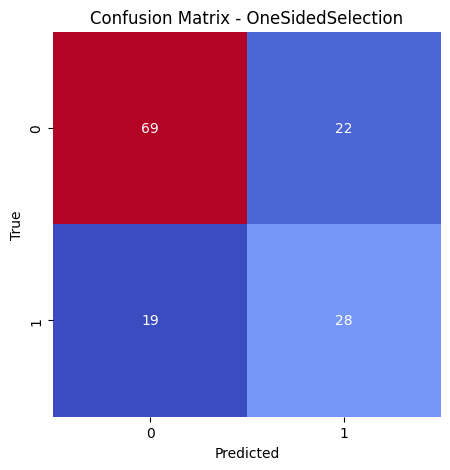

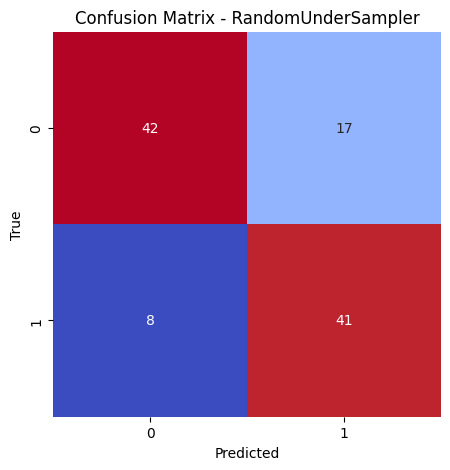

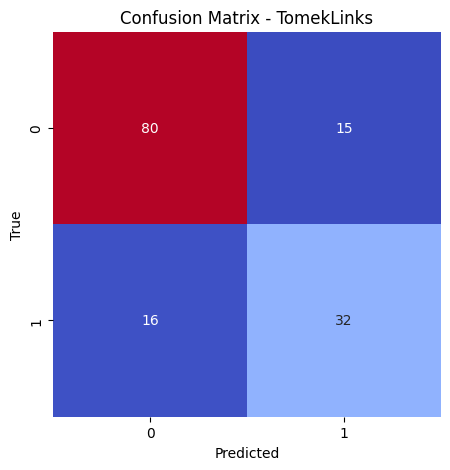

+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7077922077922078 | 0.5806451612903226 | 0.6545454545454545 | 0.6153846153846153 |
|           SMOTE           |        0.79        | 0.7610619469026548 | 0.8514851485148515 | 0.8037383177570093 |
|        KMeansSMOTE        | 0.7761194029850746 | 0.7884615384615384 | 0.780952380952381  | 0.7846889952153111 |
|           ADASYN          | 0.7435897435897436 | 0.7422680412371134 | 0.7422680412371134 | 0.7422680412371134 |
|          SVMSMOTE         |       0.815        | 0.8018867924528302 | 0.8415841584158416 | 0.821256038647343  |
|     RandomOverSampler     |       0.805        | 0.7767857142857143 | 0.86138613861386

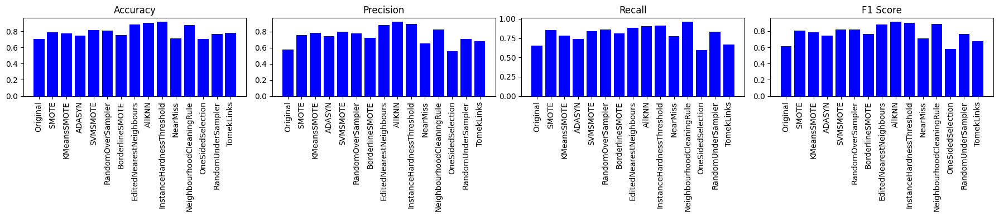

In [ ]:
plot_metrics_comparison_xgboost(X, y, oversamplers + undersamplers)

[LightGBM] [Info] Number of positive: 213, number of negative: 401
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.346906 -> initscore=-0.632669
[LightGBM] [Info] Start training from score -0.632669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

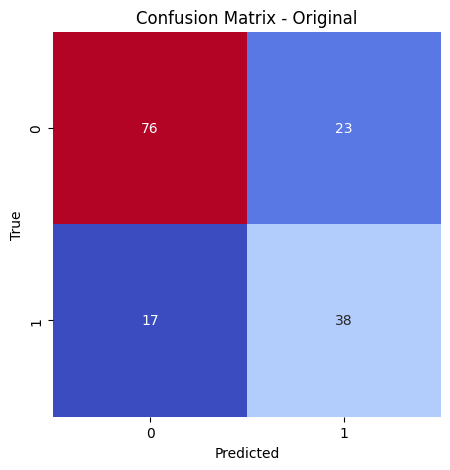

[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Total Bins 1177
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


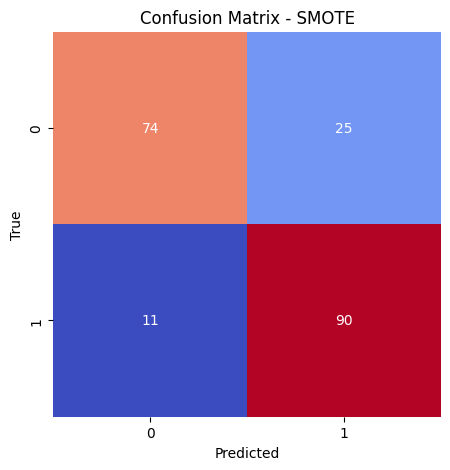

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


[LightGBM] [Info] Number of positive: 397, number of negative: 404
[LightGBM] [Info] Total Bins 1118
[LightGBM] [Info] Number of data points in the train set: 801, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.495630 -> initscore=-0.017479
[LightGBM] [Info] Start training from score -0.017479
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


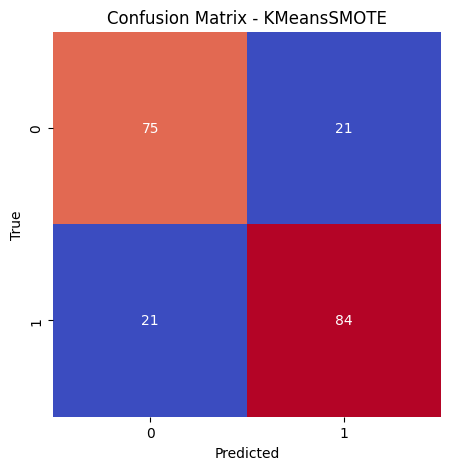

[LightGBM] [Info] Number of positive: 377, number of negative: 402
[LightGBM] [Info] Total Bins 1135
[LightGBM] [Info] Number of data points in the train set: 779, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.483954 -> initscore=-0.064207
[LightGBM] [Info] Start training from score -0.064207
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


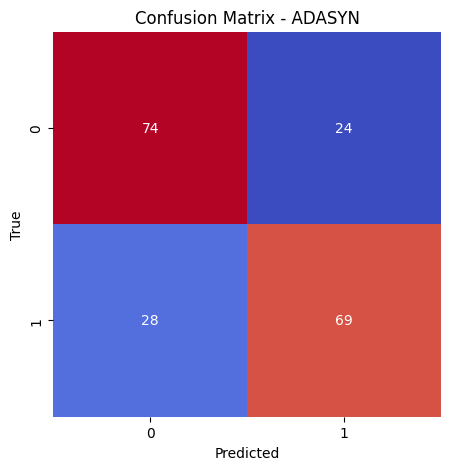

[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Total Bins 1200
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


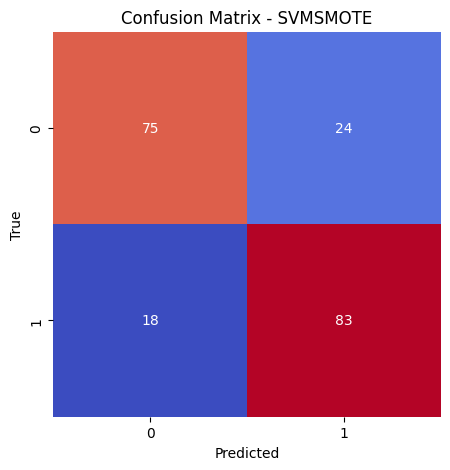

[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Total Bins 745
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

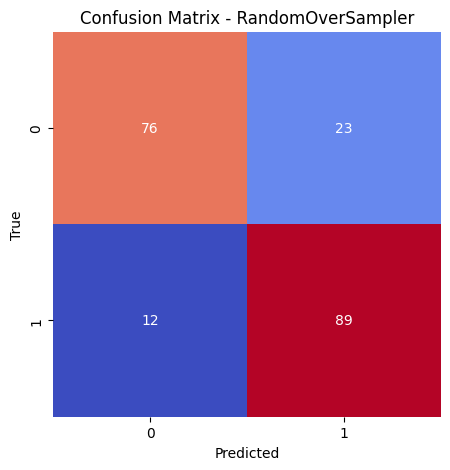

[LightGBM] [Info] Number of positive: 399, number of negative: 401
[LightGBM] [Info] Total Bins 1165
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.498750 -> initscore=-0.005000
[LightGBM] [Info] Start training from score -0.005000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


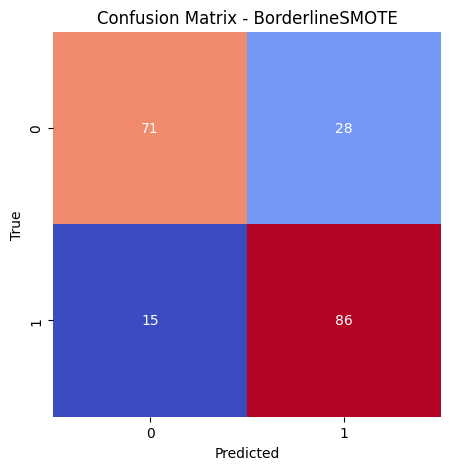

[LightGBM] [Info] Number of positive: 217, number of negative: 189
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 406, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.534483 -> initscore=0.138150
[LightGBM] [Info] Start training from score 0.138150
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

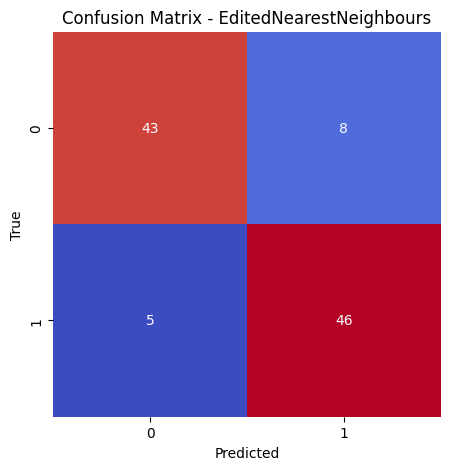

[LightGBM] [Info] Number of positive: 214, number of negative: 159
[LightGBM] [Info] Total Bins 484
[LightGBM] [Info] Number of data points in the train set: 373, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.573727 -> initscore=0.297072
[LightGBM] [Info] Start training from score 0.297072
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

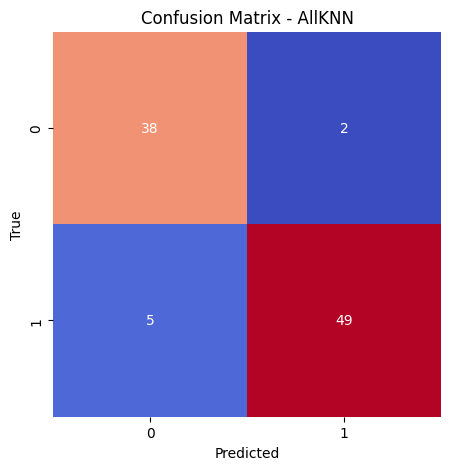

[LightGBM] [Info] Number of positive: 221, number of negative: 213
[LightGBM] [Info] Total Bins 524
[LightGBM] [Info] Number of data points in the train set: 434, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.509217 -> initscore=0.036871
[LightGBM] [Info] Start training from score 0.036871
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

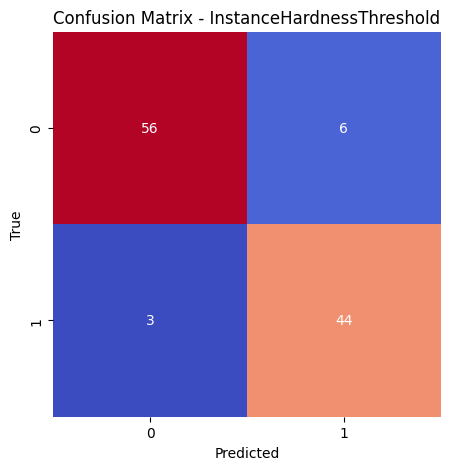

[LightGBM] [Info] Number of positive: 219, number of negative: 209
[LightGBM] [Info] Total Bins 508
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.511682 -> initscore=0.046737
[LightGBM] [Info] Start training from score 0.046737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

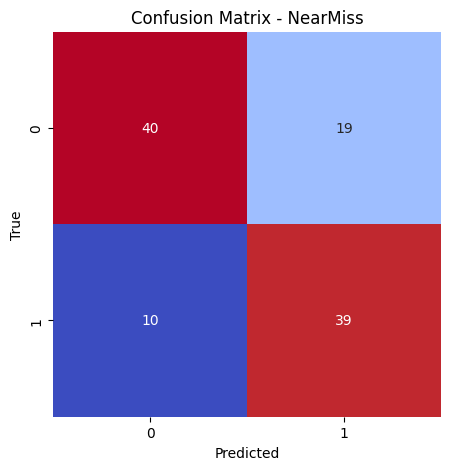

[LightGBM] [Info] Number of positive: 214, number of negative: 200
[LightGBM] [Info] Total Bins 523
[LightGBM] [Info] Number of data points in the train set: 414, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.516908 -> initscore=0.067659
[LightGBM] [Info] Start training from score 0.067659
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

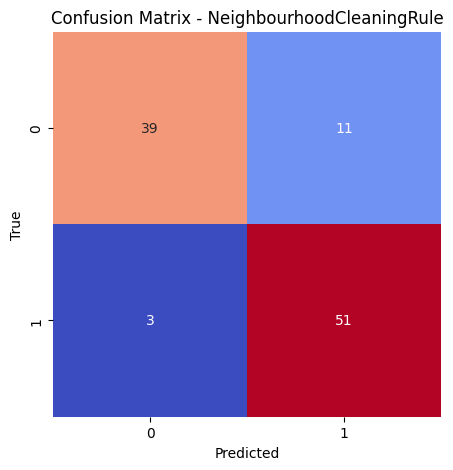

[LightGBM] [Info] Number of positive: 221, number of negative: 331
[LightGBM] [Info] Total Bins 624
[LightGBM] [Info] Number of data points in the train set: 552, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.400362 -> initscore=-0.403956
[LightGBM] [Info] Start training from score -0.403956
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

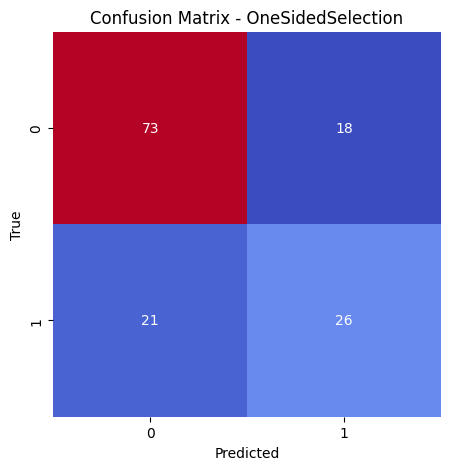

[LightGBM] [Info] Number of positive: 219, number of negative: 209
[LightGBM] [Info] Total Bins 518
[LightGBM] [Info] Number of data points in the train set: 428, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.511682 -> initscore=0.046737
[LightGBM] [Info] Start training from score 0.046737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Li

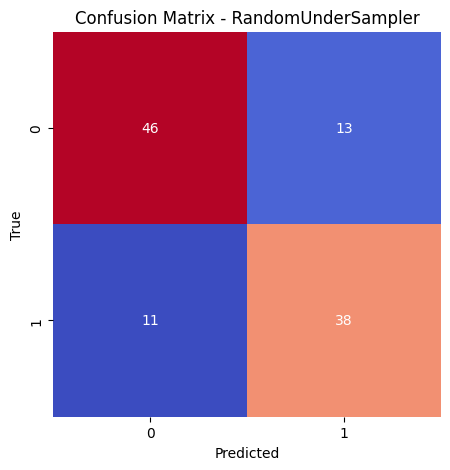

[LightGBM] [Info] Number of positive: 220, number of negative: 350
[LightGBM] [Info] Total Bins 638
[LightGBM] [Info] Number of data points in the train set: 570, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.385965 -> initscore=-0.464306
[LightGBM] [Info] Start training from score -0.464306
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[

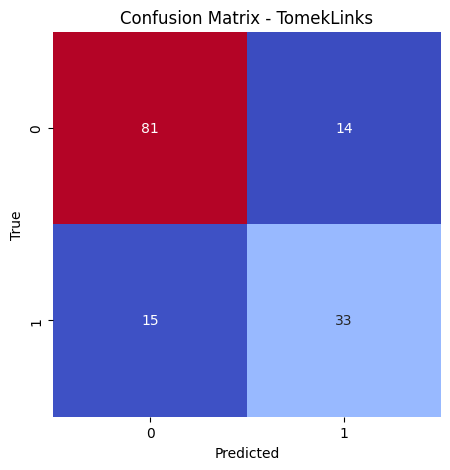

+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7402597402597403 | 0.6229508196721312 | 0.6909090909090909 | 0.6551724137931035 |
|           SMOTE           |        0.82        | 0.782608695652174  | 0.8910891089108911 | 0.8333333333333333 |
|        KMeansSMOTE        | 0.7910447761194029 |        0.8         |        0.8         | 0.8000000000000002 |
|           ADASYN          | 0.7333333333333333 | 0.7419354838709677 | 0.711340206185567  | 0.7263157894736842 |
|          SVMSMOTE         |        0.79        | 0.7757009345794392 | 0.8217821782178217 | 0.7980769230769231 |
|     RandomOverSampler     |       0.825        | 0.7946428571428571 | 0.88118811881188

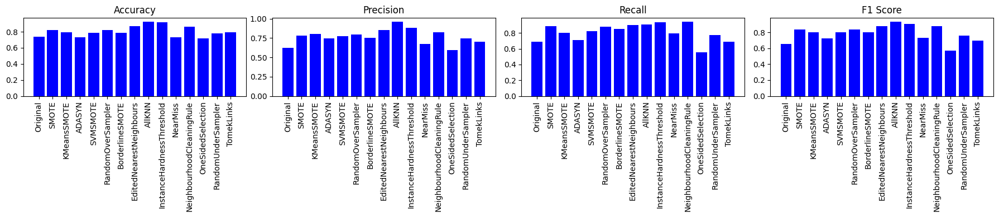

In [ ]:
#lightgbm
def plot_metrics_comparison_lightgbm(X, y, samplers):
    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    # Original dataset
    X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X, y, test_size=0.2, random_state=42)
    lgbm_model_orig = LGBMClassifier(random_state=42, force_col_wise=True, num_leaves=42, min_child_samples=60)
    lgbm_model_orig.fit(X_train_orig, y_train_orig)
    y_pred_orig = lgbm_model_orig.predict(X_test_orig)

    accuracy_orig = accuracy_score(y_test_orig, y_pred_orig)
    precision_orig = precision_score(y_test_orig, y_pred_orig)
    recall_orig = recall_score(y_test_orig, y_pred_orig)
    f1_orig = f1_score(y_test_orig, y_pred_orig)

    metrics_values['Accuracy'].append(accuracy_orig)
    metrics_values['Precision'].append(precision_orig)
    metrics_values['Recall'].append(recall_orig)
    metrics_values['F1 Score'].append(f1_orig)

    # Confusion Matrix for Original dataset
    cm_orig = confusion_matrix(y_test_orig, y_pred_orig)
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm_orig, annot=True, fmt='d', cmap='coolwarm', cbar=False)
    plt.title('Confusion Matrix - Original')
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.show()

    for sampler in samplers:
        X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

        lgbm_model = LGBMClassifier(random_state=42, force_col_wise=True)
        lgbm_model.fit(X_train, y_train)
        y_pred = lgbm_model.predict(X_test)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Confusion Matrix for Resampled dataset
        cm_resampled = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(5, 5))
        sns.heatmap(cm_resampled, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler.__class__.__name__}')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.show()

    # Create a PrettyTable
    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for sampler, accuracy, precision, recall, f1 in zip(['Original'] + [sampler.__class__.__name__ for sampler in samplers],
                                                      metrics_values['Accuracy'], metrics_values['Precision'],
                                                      metrics_values['Recall'], metrics_values['F1 Score']):
        table.add_row([sampler, accuracy, precision, recall, f1])

    print(table)

    # Plot for each metric
    plt.figure(figsize=(18, 4))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(1, 4, i)
        plt.bar(['Original'] + [sampler.__class__.__name__ for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()

plot_metrics_comparison_lightgbm(X, y, oversamplers + undersamplers)


Training and Evaluating with Sampler: Original
5/5 [==============================] - 0s 5ms/step


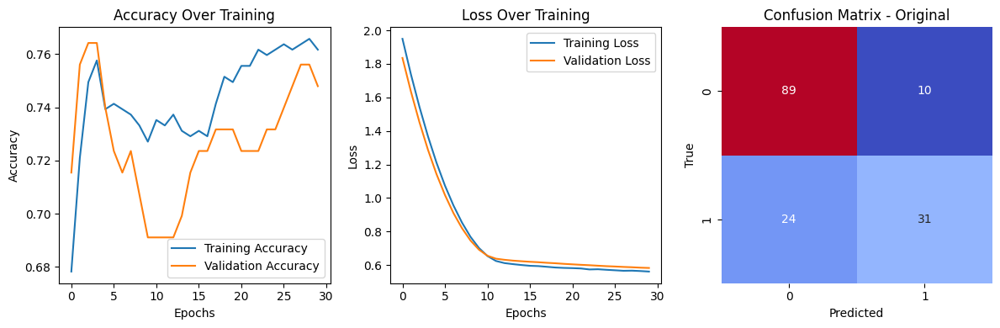


Training and Evaluating with Sampler: SMOTE
7/7 [==============================] - 1s 3ms/step


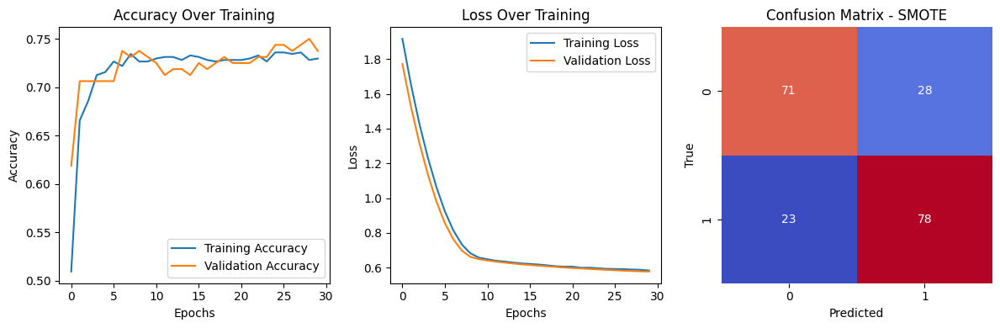

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Training and Evaluating with Sampler: KMeansSMOTE
7/7 [==============================] - 0s 3ms/step


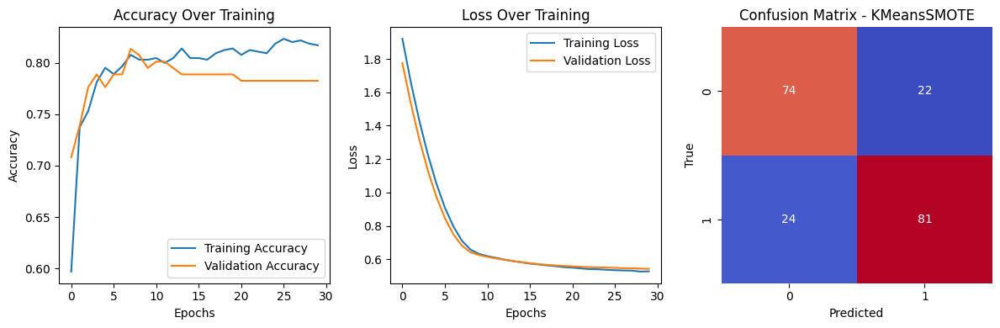


Training and Evaluating with Sampler: ADASYN
7/7 [==============================] - 1s 3ms/step


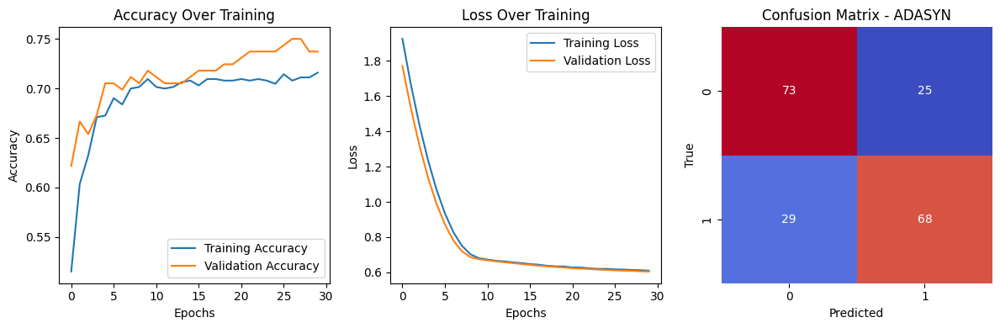


Training and Evaluating with Sampler: SVMSMOTE
7/7 [==============================] - 1s 3ms/step


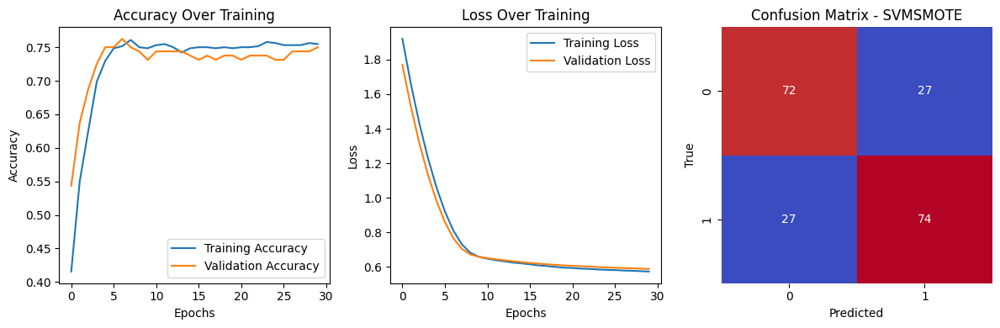


Training and Evaluating with Sampler: RandomOverSampler
7/7 [==============================] - 0s 3ms/step


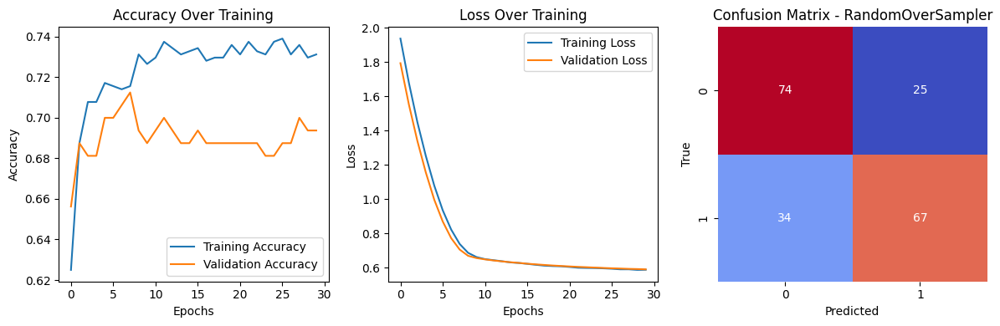


Training and Evaluating with Sampler: BorderlineSMOTE
7/7 [==============================] - 1s 3ms/step


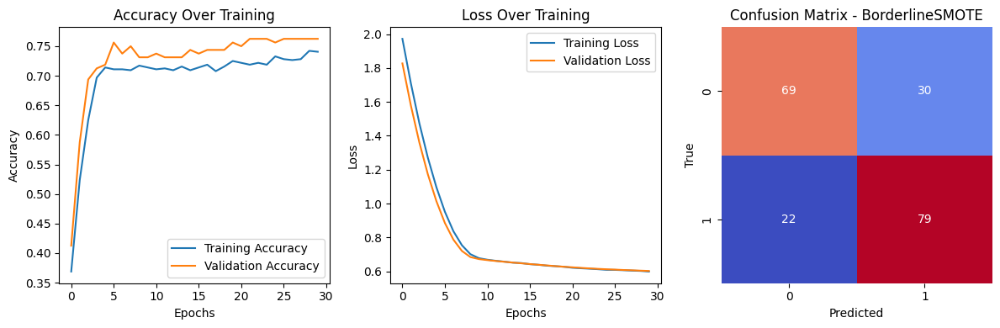


Training and Evaluating with Sampler: EditedNearestNeighbours
4/4 [==============================] - 0s 4ms/step


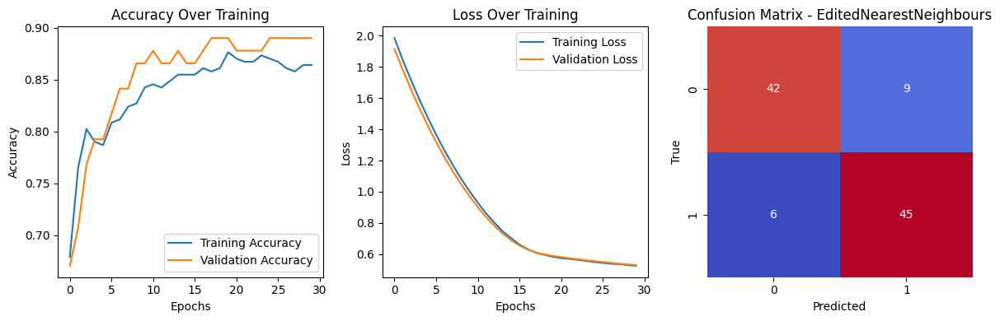


Training and Evaluating with Sampler: AllKNN
3/3 [==============================] - 0s 5ms/step


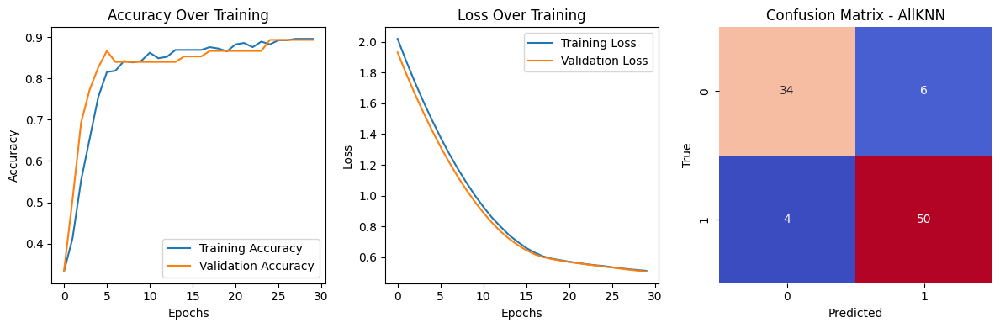


Training and Evaluating with Sampler: InstanceHardnessThreshold
4/4 [==============================] - 1s 5ms/step


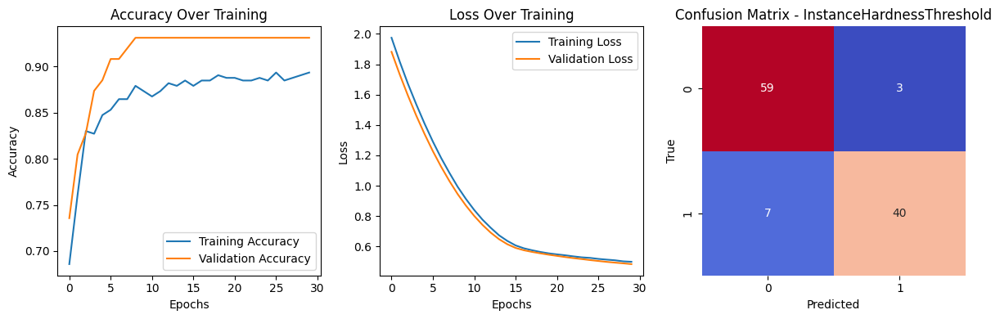


Training and Evaluating with Sampler: NearMiss
4/4 [==============================] - 0s 5ms/step


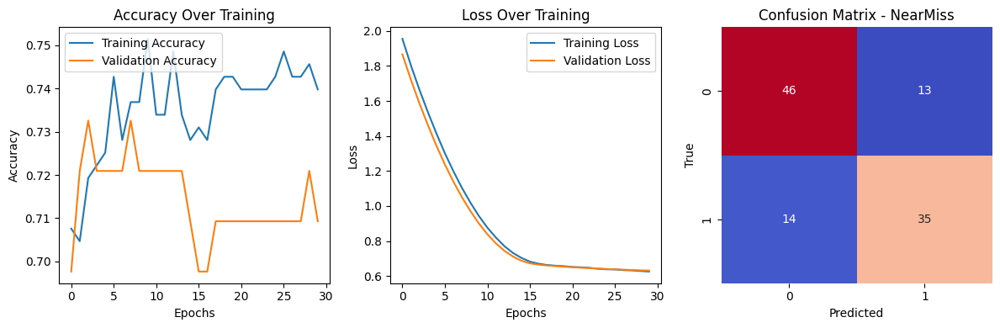


Training and Evaluating with Sampler: NeighbourhoodCleaningRule
4/4 [==============================] - 0s 4ms/step


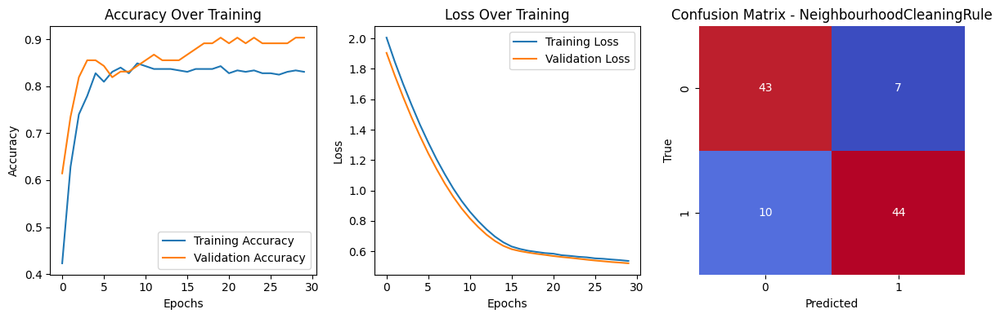


Training and Evaluating with Sampler: OneSidedSelection
5/5 [==============================] - 0s 4ms/step


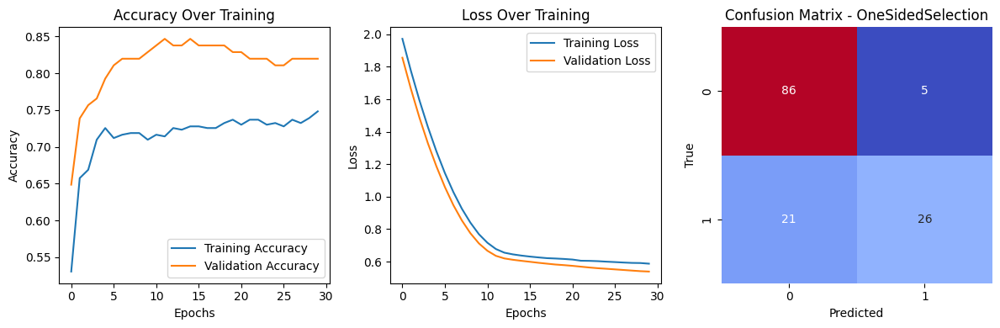


Training and Evaluating with Sampler: RandomUnderSampler
4/4 [==============================] - 0s 5ms/step


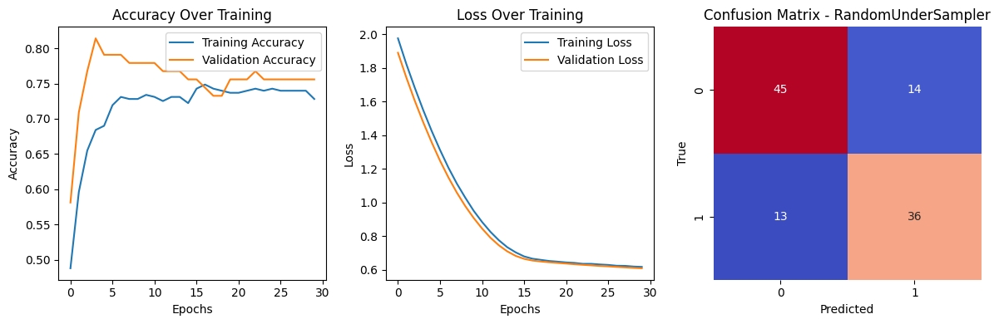


Training and Evaluating with Sampler: TomekLinks
5/5 [==============================] - 0s 5ms/step


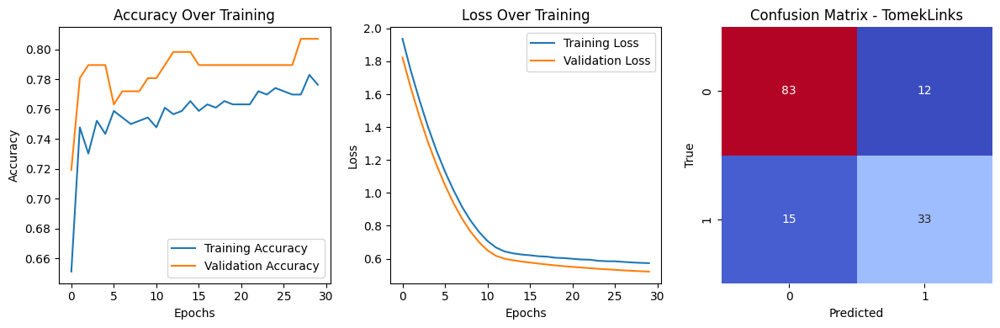

Metrics Comparison:
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7792207792207793 | 0.7560975609756098 | 0.5636363636363636 | 0.6458333333333333 |
|           SMOTE           |       0.745        | 0.7358490566037735 | 0.7722772277227723 | 0.7536231884057971 |
|        KMeansSMOTE        | 0.7711442786069652 | 0.7864077669902912 | 0.7714285714285715 | 0.7788461538461539 |
|           ADASYN          | 0.7230769230769231 | 0.7311827956989247 | 0.7010309278350515 | 0.7157894736842105 |
|          SVMSMOTE         |        0.73        | 0.7326732673267327 | 0.7326732673267327 | 0.7326732673267327 |
|     RandomOverSampler     |       0.705        | 0.728260869565217

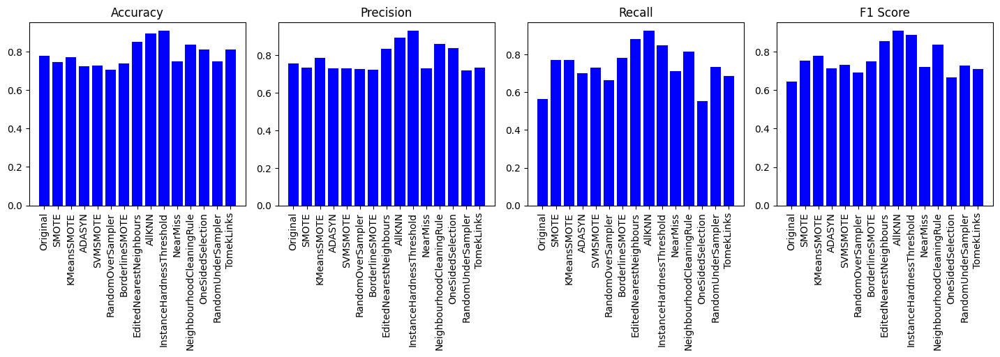

In [ ]:
#LSTM
def train_evaluate_lstm_metrics_comparison(X, y, oversamplers=None, undersamplers=None, dropout_rate=0.1, l1_reg=0.01, epochs=30, batch_size=36, test_size=0.2):
    if oversamplers is None:
        oversamplers = [RandomOverSampler()]  # Default to RandomOverSampler if not provided
    if undersamplers is None:
        undersamplers = [RandomUnderSampler()]  # Default to RandomUnderSampler if not provided

    samplers = [None] + oversamplers + undersamplers  # Include original data as the first sampler

    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    for sampler in samplers:
        if sampler is None:
            X_resampled, y_resampled = X, y  # Use original data
        else:
            X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=test_size, random_state=42)

        if sampler is None:
          sampler_name = 'Original'
        else:
          sampler_name = sampler.__class__.__name__

        print(f"\nTraining and Evaluating with Sampler: {sampler_name}")


        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Reshape the input data for LSTM
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        # Build LSTM model with Dropout and L1 regularization
        model = Sequential()
        model.add(LSTM(50, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]),
                       kernel_regularizer=l1(l1_reg)))
        model.add(Dropout(dropout_rate))
        model.add(Dense(1, activation='sigmoid'))
        adam = Adam(learning_rate=0.001)
        model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

        # Train the model
        history = History()  # Create a history object to store training history
        model.fit(X_train_reshaped, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0, callbacks=[history])


        # Evaluate the model
        y_pred_probs = model.predict(X_test_reshaped)
        y_pred = (y_pred_probs > 0.5).astype(int)

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)


        # Plot accuracy and loss during training
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot accuracy and loss during training
        plt.subplot(1, 3, 3)
        sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler_name}')
        plt.xlabel('Predicted')
        plt.ylabel('True')

        plt.tight_layout()
        plt.show()

        # Append metrics values
        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for i, sampler in enumerate(samplers):
        table.add_row([sampler.__class__.__name__ if sampler else 'Original',
                       metrics_values['Accuracy'][i],
                       metrics_values['Precision'][i],
                       metrics_values['Recall'][i],
                       metrics_values['F1 Score'][i]])

    print("Metrics Comparison:")
    print(table)
    # Plot for each metric
    plt.figure(figsize=(18, 8))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(2, 5, i)
        plt.bar([sampler.__class__.__name__ if sampler else 'Original' for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()

# Example usage:
train_evaluate_lstm_metrics_comparison(X, y, oversamplers, undersamplers)



Training and Evaluating with Sampler: Original
5/5 [==============================] - 0s 3ms/step


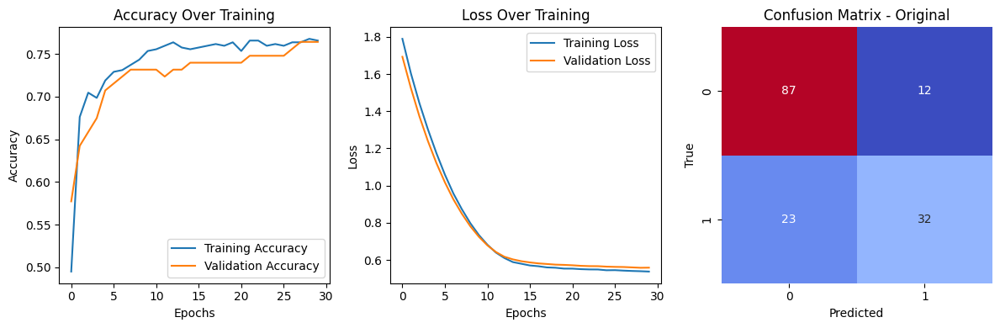


Training and Evaluating with Sampler: SMOTE
7/7 [==============================] - 0s 3ms/step


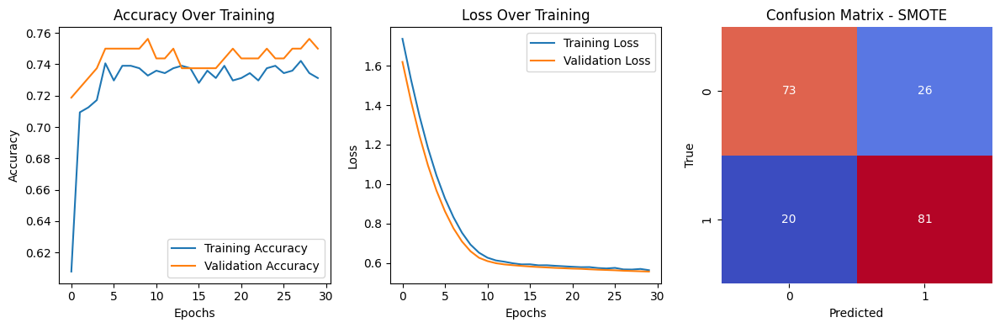

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Training and Evaluating with Sampler: KMeansSMOTE
7/7 [==============================] - 1s 4ms/step


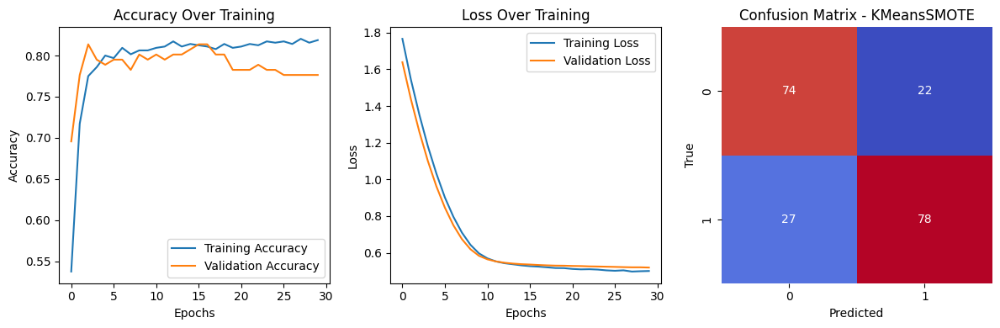


Training and Evaluating with Sampler: ADASYN
7/7 [==============================] - 0s 3ms/step


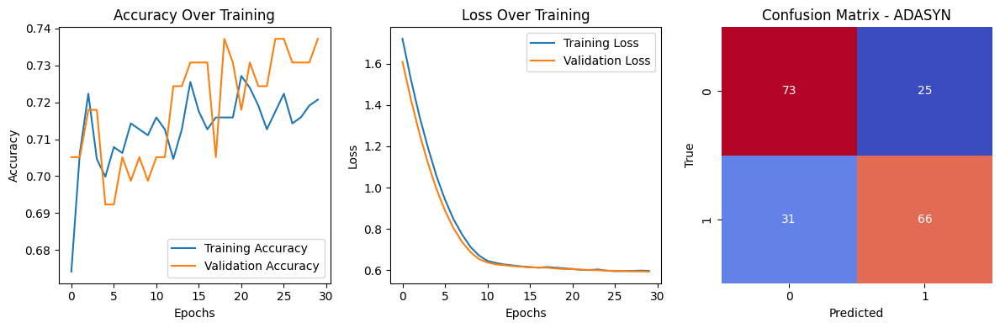


Training and Evaluating with Sampler: SVMSMOTE
7/7 [==============================] - 0s 2ms/step


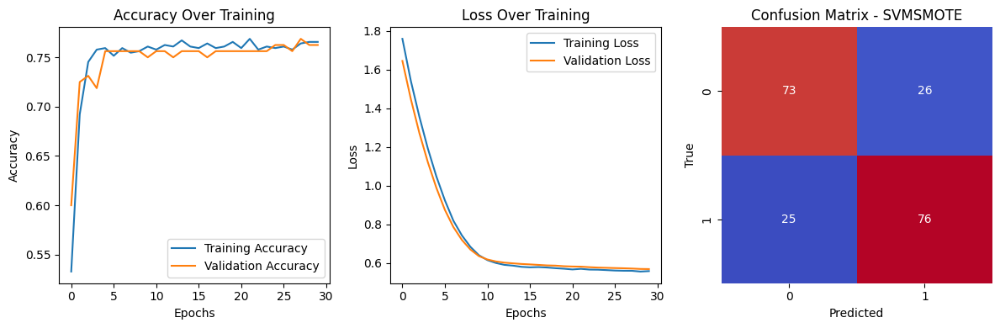


Training and Evaluating with Sampler: RandomOverSampler
7/7 [==============================] - 0s 3ms/step


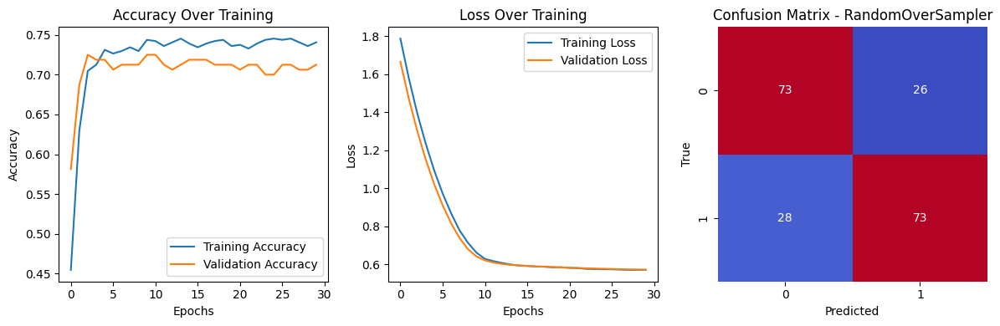


Training and Evaluating with Sampler: BorderlineSMOTE
7/7 [==============================] - 1s 3ms/step


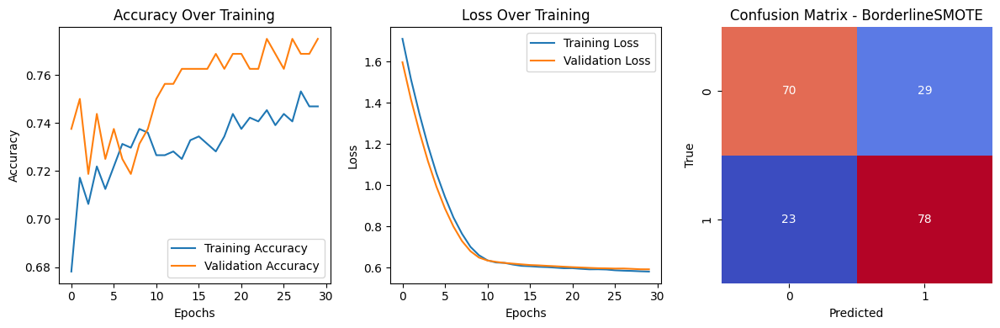


Training and Evaluating with Sampler: EditedNearestNeighbours
4/4 [==============================] - 1s 5ms/step


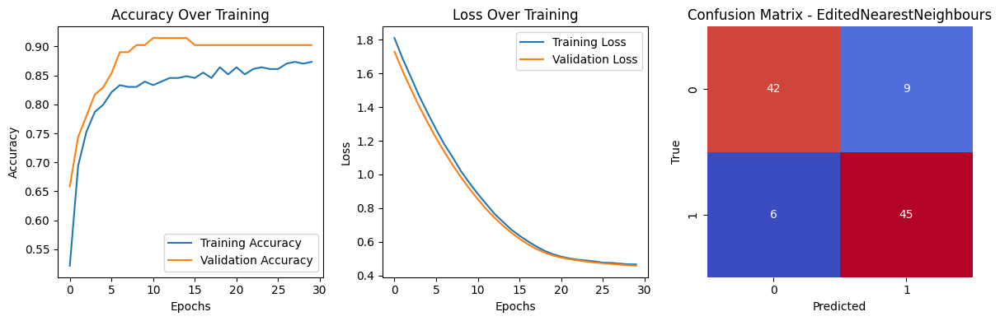


Training and Evaluating with Sampler: AllKNN
3/3 [==============================] - 0s 6ms/step


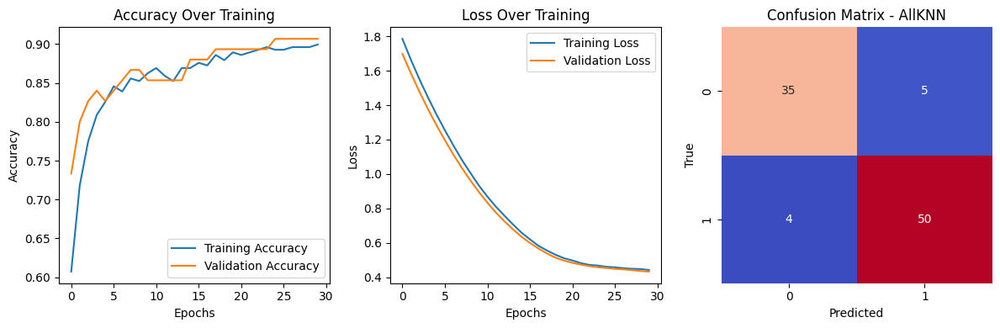


Training and Evaluating with Sampler: InstanceHardnessThreshold
4/4 [==============================] - 1s 3ms/step


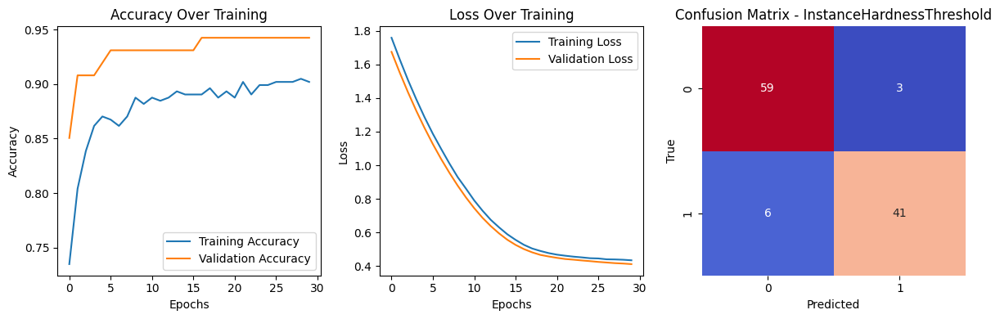


Training and Evaluating with Sampler: NearMiss
4/4 [==============================] - 0s 4ms/step


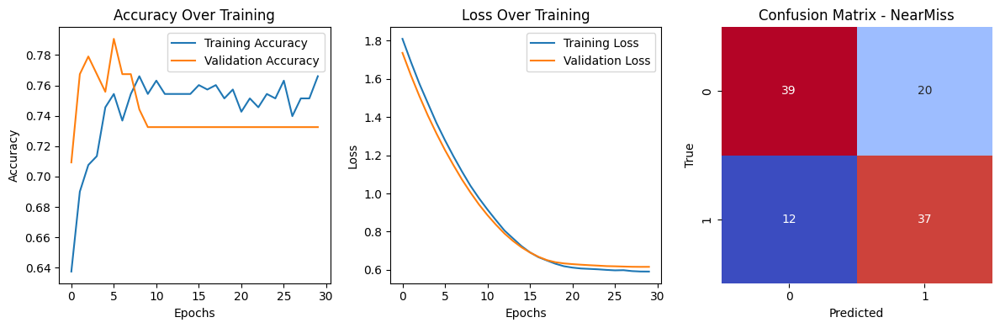


Training and Evaluating with Sampler: NeighbourhoodCleaningRule
4/4 [==============================] - 1s 4ms/step


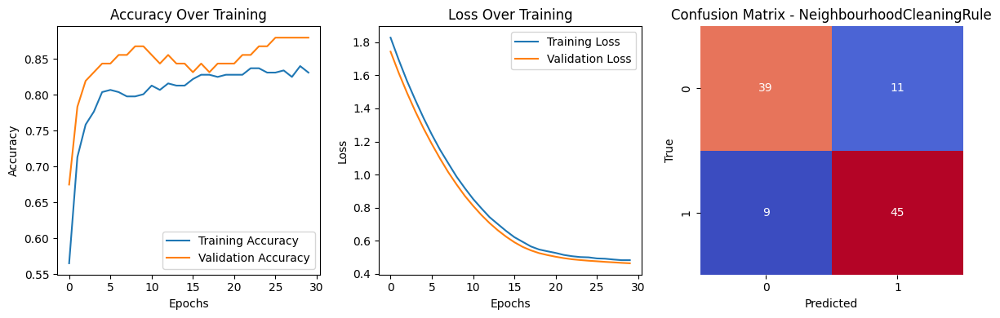


Training and Evaluating with Sampler: OneSidedSelection
5/5 [==============================] - 0s 5ms/step


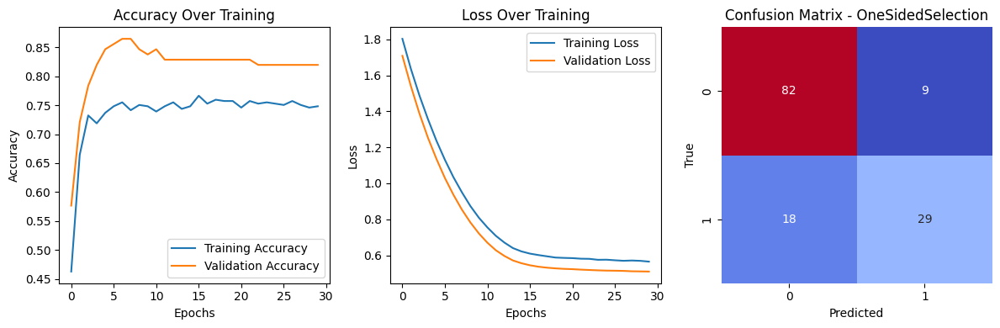


Training and Evaluating with Sampler: RandomUnderSampler
4/4 [==============================] - 1s 5ms/step


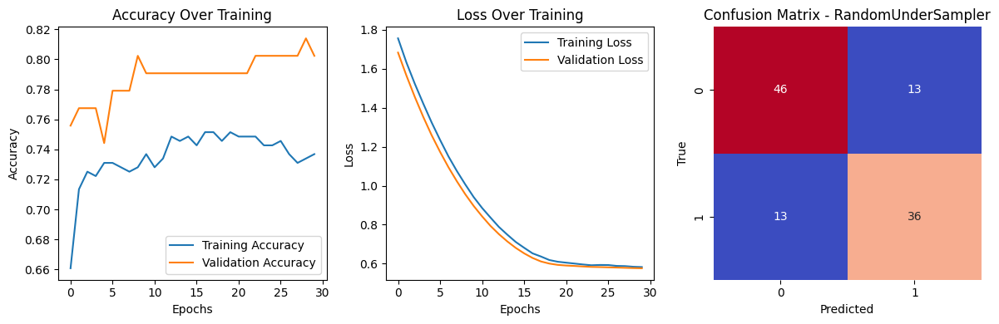


Training and Evaluating with Sampler: TomekLinks
5/5 [==============================] - 0s 4ms/step


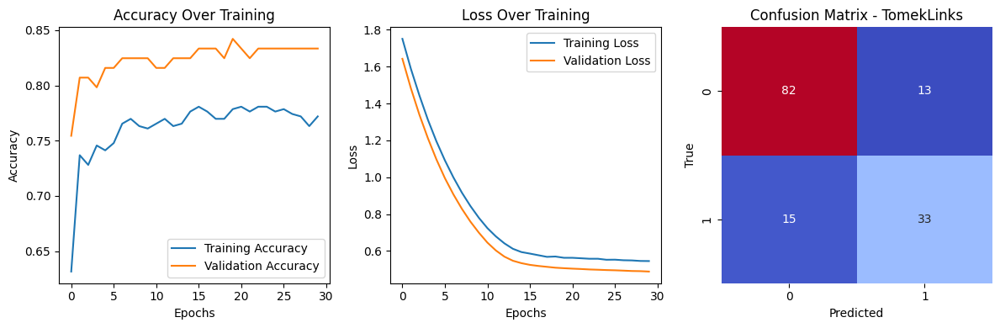

Metrics Comparison:
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7727272727272727 | 0.7272727272727273 | 0.5818181818181818 | 0.6464646464646464 |
|           SMOTE           |        0.77        | 0.7570093457943925 | 0.801980198019802  | 0.7788461538461539 |
|        KMeansSMOTE        | 0.7562189054726368 |        0.78        | 0.7428571428571429 | 0.7609756097560977 |
|           ADASYN          | 0.7128205128205128 | 0.7252747252747253 | 0.6804123711340206 | 0.7021276595744682 |
|          SVMSMOTE         |       0.745        | 0.7450980392156863 | 0.7524752475247525 | 0.748768472906404  |
|     RandomOverSampler     |        0.73        | 0.737373737373737

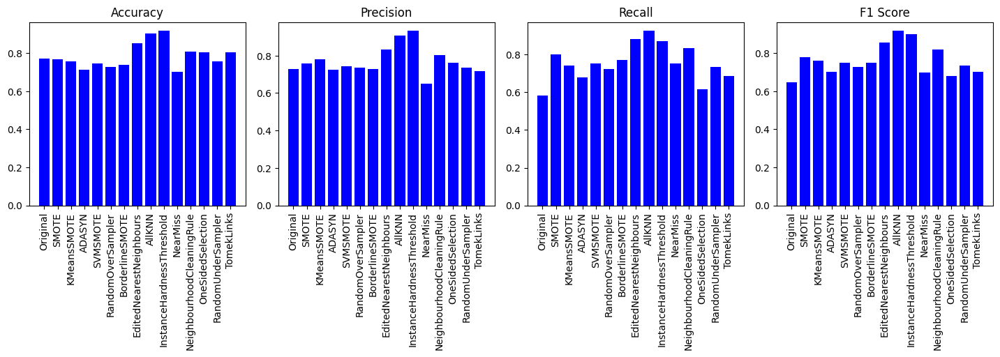

In [ ]:
#GRU
def train_evaluate_gru_metrics_comparison(X, y, oversamplers=None, undersamplers=None, dropout_rate=0.1, l1_reg=0.01, epochs=30, batch_size=36, test_size=0.2):
    if oversamplers is None:
        oversamplers = [RandomOverSampler()]  # Default to RandomOverSampler if not provided
    if undersamplers is None:
        undersamplers = [RandomUnderSampler()]  # Default to RandomUnderSampler if not provided

    samplers = [None] + oversamplers + undersamplers  # Include original data as the first sampler

    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    for sampler in samplers:
        if sampler is None:
            X_resampled, y_resampled = X, y  # Use original data
        else:
            X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=test_size, random_state=42)

        if sampler is None:
          sampler_name = 'Original'
        else:
          sampler_name = sampler.__class__.__name__

        print(f"\nTraining and Evaluating with Sampler: {sampler_name}")



        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Reshape the input data for GRU
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], 1, X_train_scaled.shape[1]))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], 1, X_test_scaled.shape[1]))

        # Build GRU model with Dropout and L1 regularization
        model = Sequential()
        model.add(GRU(50, input_shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]),
                       kernel_regularizer=l1(l1_reg)))
        model.add(Dropout(dropout_rate))
        model.add(Dense(1, activation='sigmoid'))
        adam = Adam(learning_rate=0.001)
        model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

        # Train the model
        history = History()  # Create a history object to store training history
        model.fit(X_train_reshaped, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0, callbacks=[history])


        # Evaluate the model
        y_pred_probs = model.predict(X_test_reshaped)
        y_pred = (y_pred_probs > 0.5).astype(int)

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Confusion Matrix
        cm = confusion_matrix(y_test, y_pred)


        # Plot accuracy and loss during training
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot accuracy and loss during training
        plt.subplot(1, 3, 3)
        sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler_name}')
        plt.xlabel('Predicted')
        plt.ylabel('True')

        plt.tight_layout()
        plt.show()

        # Append metrics values
        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for i, sampler in enumerate(samplers):
        table.add_row([sampler.__class__.__name__ if sampler else 'Original',
                       metrics_values['Accuracy'][i],
                       metrics_values['Precision'][i],
                       metrics_values['Recall'][i],
                       metrics_values['F1 Score'][i]])

    print("Metrics Comparison:")
    print(table)
    # Plot for each metric
    plt.figure(figsize=(18, 8))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(2, 5, i)
        plt.bar([sampler.__class__.__name__ if sampler else 'Original' for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')  # Rotate x-axis labels
        plt.tick_params(axis='both', which='major', labelsize=10)  # Adjust font size

    plt.tight_layout()
    plt.show()


train_evaluate_gru_metrics_comparison(X, y, oversamplers, undersamplers)


Training and Evaluating with Sampler: Original
5/5 [==============================] - 0s 5ms/step


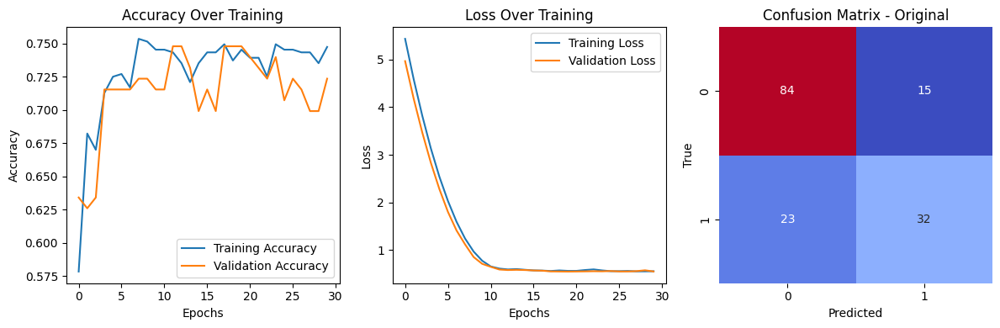


Training and Evaluating with Sampler: SMOTE
7/7 [==============================] - 0s 3ms/step


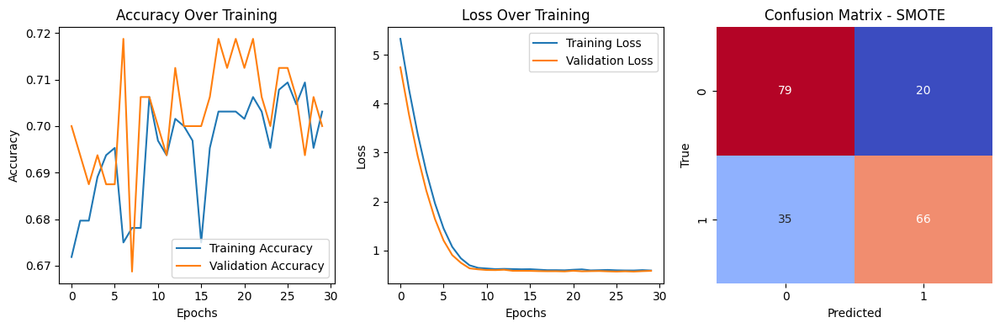

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Training and Evaluating with Sampler: KMeansSMOTE
7/7 [==============================] - 1s 5ms/step


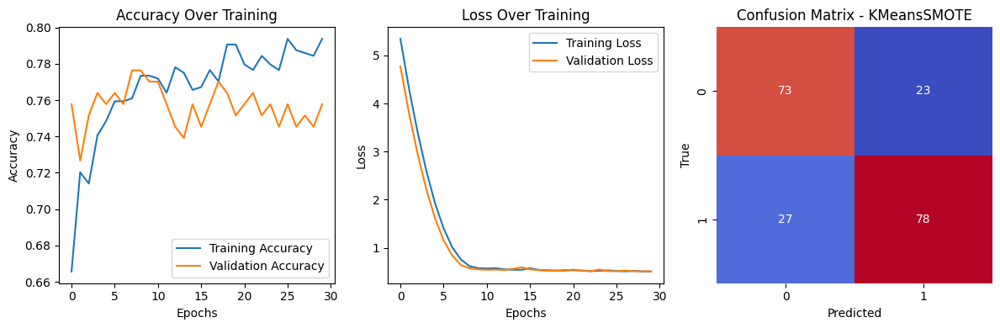


Training and Evaluating with Sampler: ADASYN
7/7 [==============================] - 0s 4ms/step


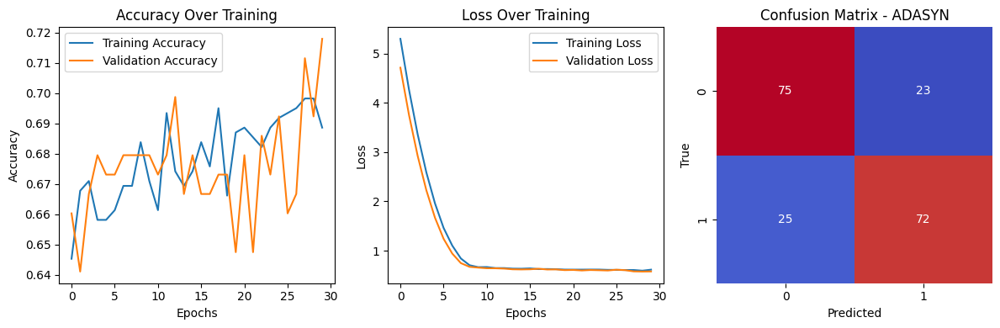


Training and Evaluating with Sampler: SVMSMOTE
7/7 [==============================] - 0s 3ms/step


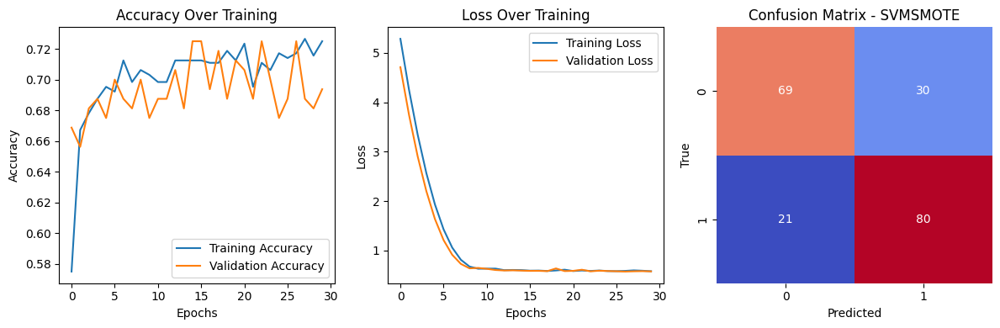


Training and Evaluating with Sampler: RandomOverSampler
7/7 [==============================] - 1s 6ms/step


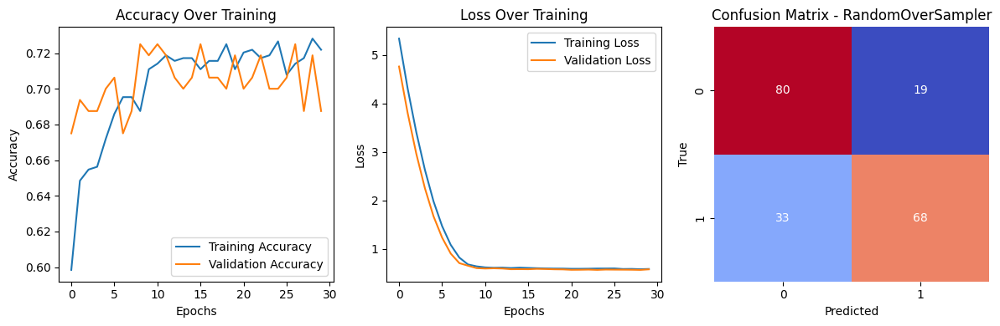


Training and Evaluating with Sampler: BorderlineSMOTE
7/7 [==============================] - 0s 4ms/step


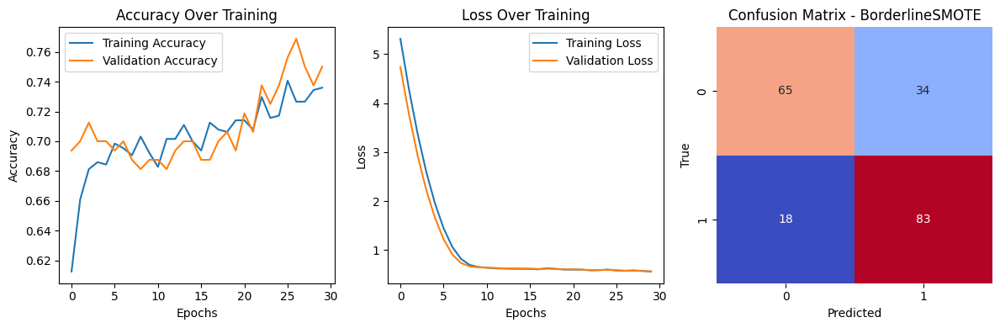


Training and Evaluating with Sampler: EditedNearestNeighbours
4/4 [==============================] - 1s 5ms/step


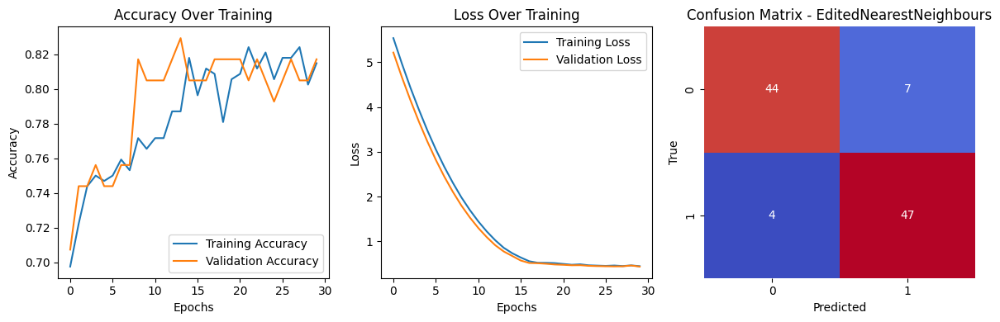


Training and Evaluating with Sampler: AllKNN
3/3 [==============================] - 1s 10ms/step


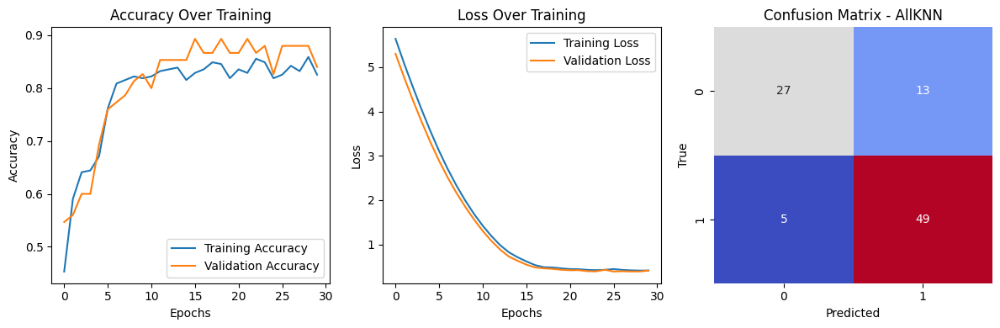


Training and Evaluating with Sampler: InstanceHardnessThreshold
4/4 [==============================] - 1s 7ms/step


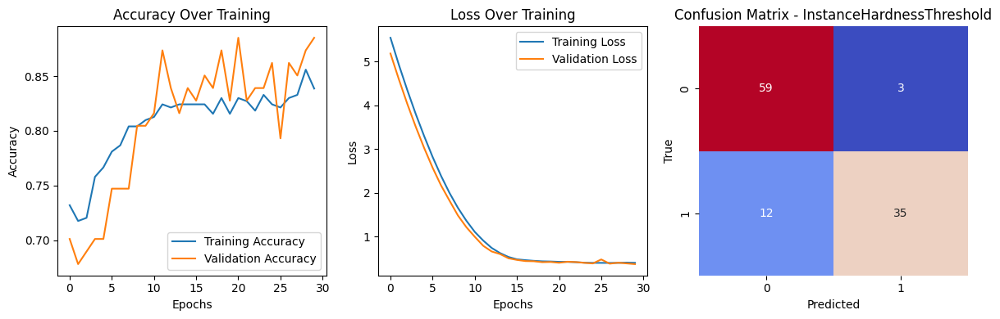


Training and Evaluating with Sampler: NearMiss
4/4 [==============================] - 0s 5ms/step


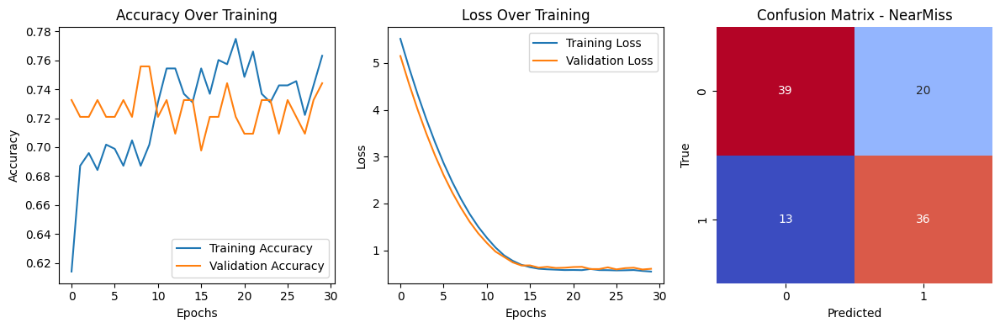


Training and Evaluating with Sampler: NeighbourhoodCleaningRule
4/4 [==============================] - 1s 8ms/step


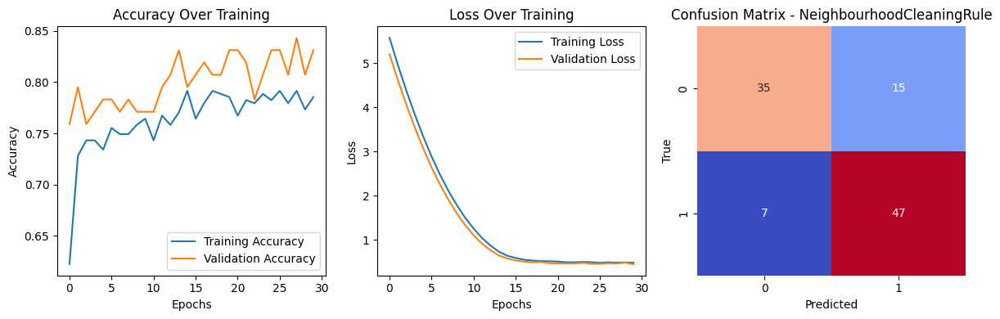


Training and Evaluating with Sampler: OneSidedSelection
5/5 [==============================] - 1s 4ms/step


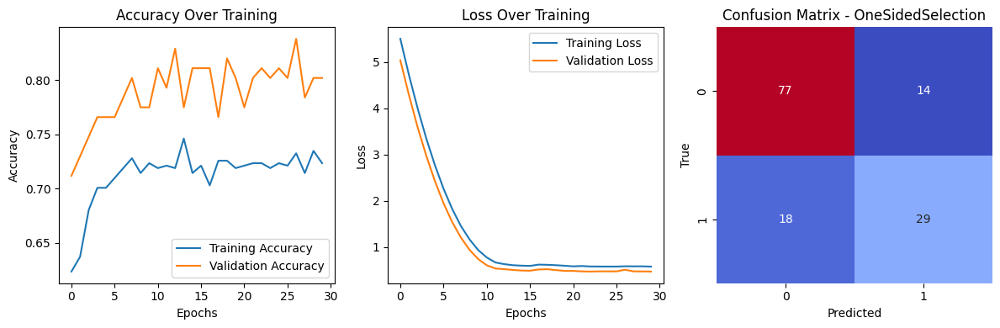


Training and Evaluating with Sampler: RandomUnderSampler
4/4 [==============================] - 1s 4ms/step


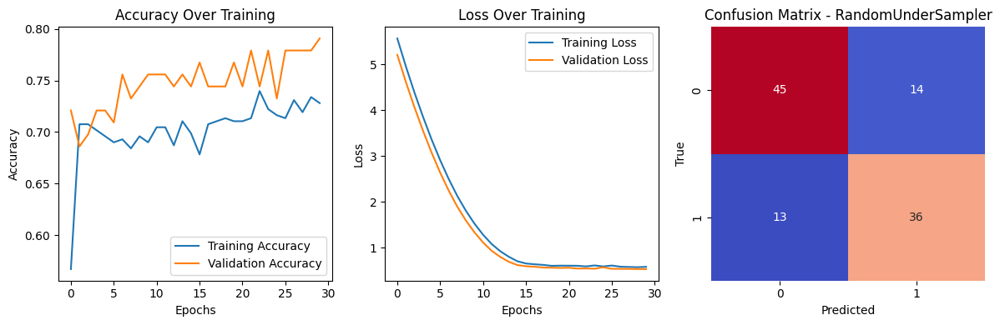


Training and Evaluating with Sampler: TomekLinks
5/5 [==============================] - 1s 6ms/step


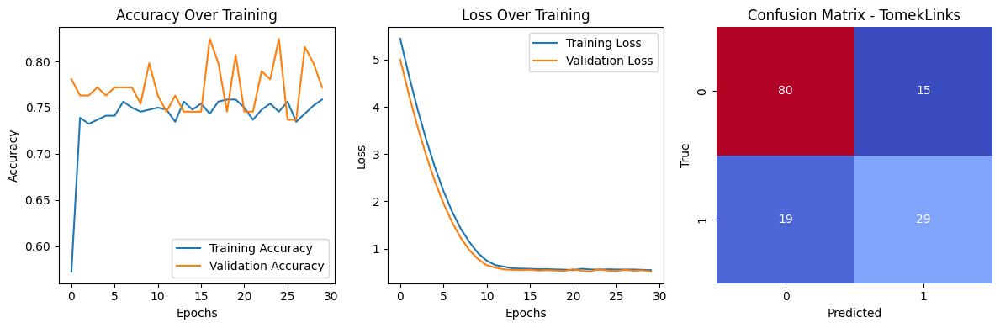

Metrics Comparison:
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7532467532467533 | 0.6808510638297872 | 0.5818181818181818 | 0.627450980392157  |
|           SMOTE           |       0.725        | 0.7674418604651163 | 0.6534653465346535 | 0.7058823529411765 |
|        KMeansSMOTE        | 0.7512437810945274 | 0.7722772277227723 | 0.7428571428571429 | 0.7572815533980582 |
|           ADASYN          | 0.7538461538461538 | 0.7578947368421053 | 0.7422680412371134 | 0.7499999999999999 |
|          SVMSMOTE         |       0.745        | 0.7272727272727273 | 0.7920792079207921 | 0.7582938388625592 |
|     RandomOverSampler     |        0.74        | 0.781609195402298

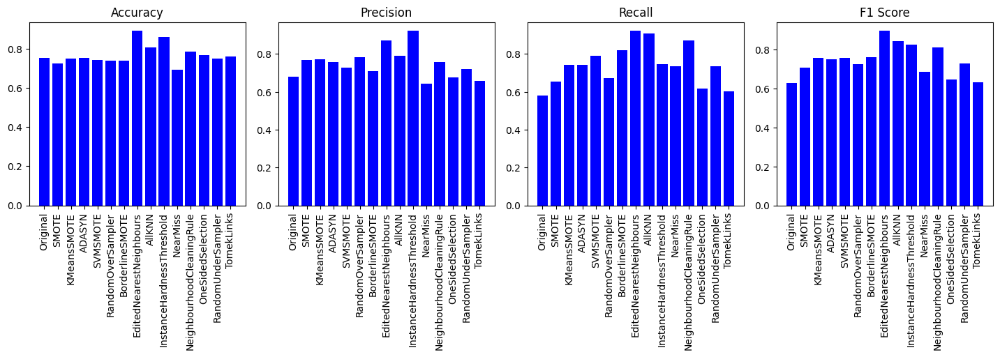

In [ ]:
#LSTM + CNN
def train_evaluate_complex_network_lstm(X, y, oversamplers=None, undersamplers=None, dropout_rate=0.15, l1_reg=0.01, epochs=30, batch_size=36, test_size=0.2):
    if oversamplers is None:
        oversamplers = [RandomOverSampler()]  # Default to RandomOverSampler if not provided
    if undersamplers is None:
        undersamplers = [RandomUnderSampler()]  # Default to RandomUnderSampler if not provided

    samplers = [None] + oversamplers + undersamplers  # Include original data as the first sampler

    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    for sampler in samplers:
        if sampler is None:
            X_resampled, y_resampled = X, y  # Use original data
        else:
            X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=test_size, random_state=42)

        if sampler is None:
          sampler_name = 'Original'
        else:
          sampler_name = sampler.__class__.__name__

        print(f"\nTraining and Evaluating with Sampler: {sampler_name}")
        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Reshape the input data for Conv1D
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

        # Build the model without GRU layer
        model = Sequential()
        model.add(Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)))
        model.add(MaxPooling1D(pool_size=2))
        model.add(LSTM(50, kernel_regularizer=l1(l1_reg), return_sequences=True))
        model.add(Dropout(dropout_rate))
        model.add(Flatten())
        model.add(Dense(32, activation='relu'))  # You can adjust the number of units in this dense layer
        model.add(Dense(1, activation='sigmoid'))
        adam = Adam(learning_rate=0.001)
        model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

        # Train the model
        history = History()
        model.fit(X_train_reshaped, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0, callbacks=[history])

        # Evaluate the model
        y_pred_probs = model.predict(X_test_reshaped)
        y_pred = (y_pred_probs > 0.5).astype(int)

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Append metrics values
        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Plot accuracy and loss during training
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot confusion matrix
        plt.subplot(1, 3, 3)
        sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler_name}')
        plt.xlabel('Predicted')
        plt.ylabel('True')

        plt.tight_layout()
        plt.show()

    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for i, sampler in enumerate(samplers):
        table.add_row([sampler.__class__.__name__ if sampler else 'Original',
                       metrics_values['Accuracy'][i],
                       metrics_values['Precision'][i],
                       metrics_values['Recall'][i],
                       metrics_values['F1 Score'][i]])

    print("Metrics Comparison:")
    print(table)
    # Plot for each metric
    plt.figure(figsize=(18, 8))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(2, 5, i)
        plt.bar([sampler.__class__.__name__ if sampler else 'Original' for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=10)

    plt.tight_layout()
    plt.show()



train_evaluate_complex_network_lstm(X, y, oversamplers, undersamplers)


Training and Evaluating with Sampler: Original
5/5 [==============================] - 0s 4ms/step


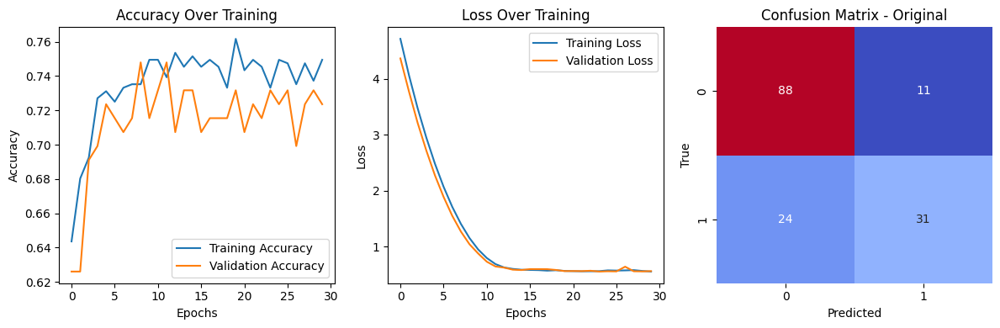


Training and Evaluating with Sampler: SMOTE
7/7 [==============================] - 0s 4ms/step


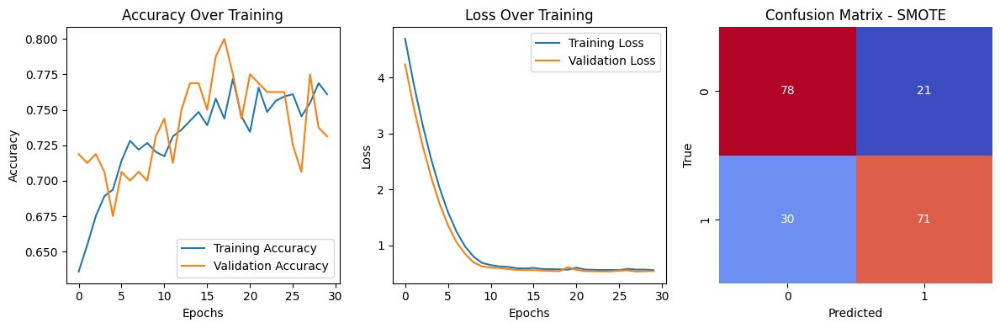

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Training and Evaluating with Sampler: KMeansSMOTE
7/7 [==============================] - 0s 4ms/step


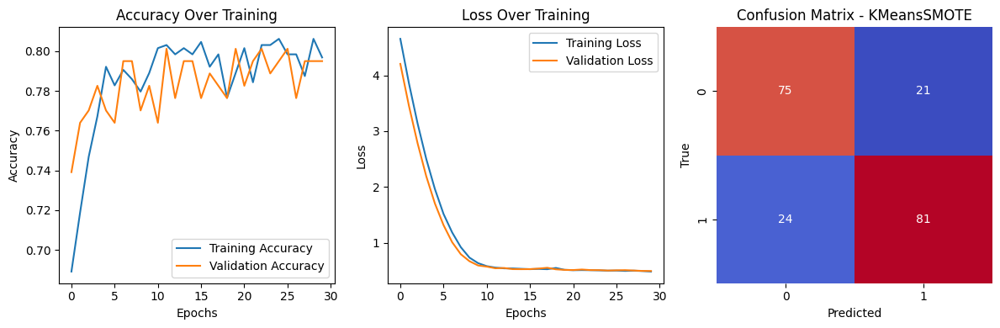


Training and Evaluating with Sampler: ADASYN
7/7 [==============================] - 0s 5ms/step


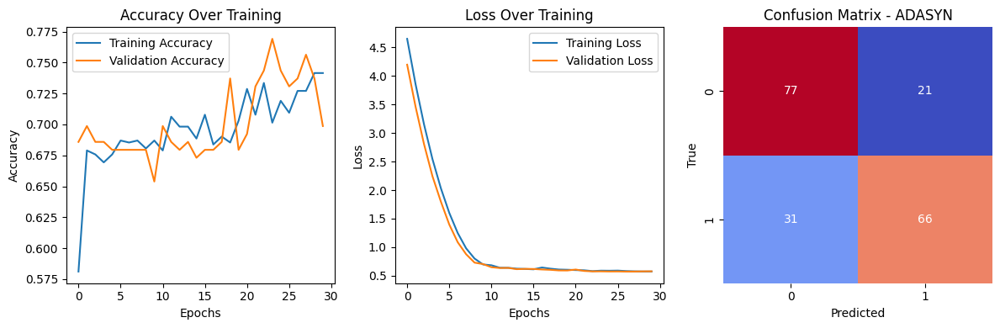


Training and Evaluating with Sampler: SVMSMOTE
7/7 [==============================] - 0s 4ms/step


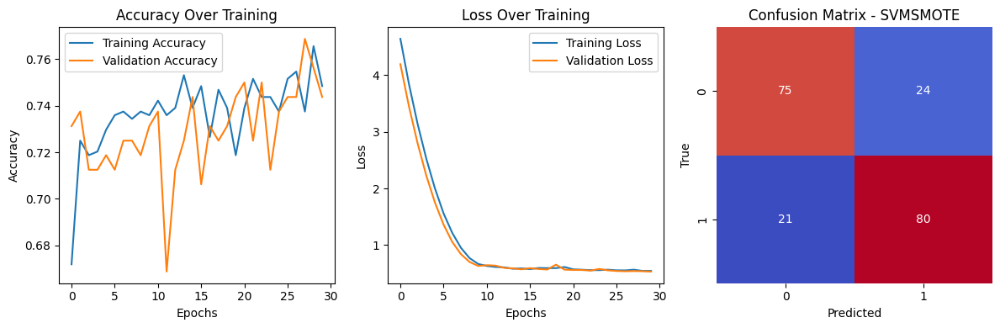


Training and Evaluating with Sampler: RandomOverSampler
7/7 [==============================] - 0s 5ms/step


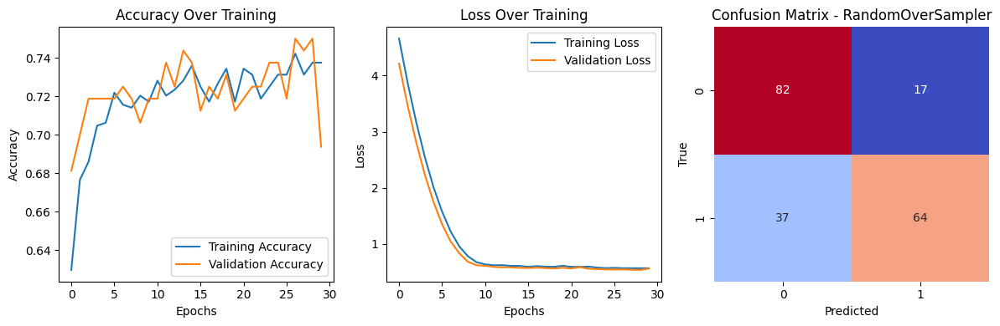


Training and Evaluating with Sampler: BorderlineSMOTE
7/7 [==============================] - 0s 4ms/step


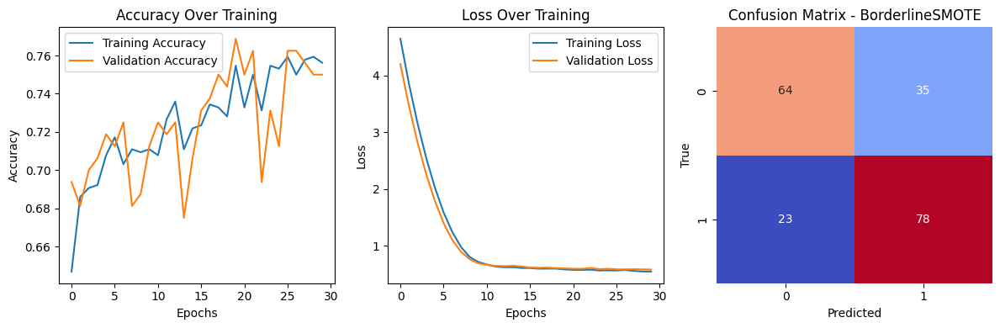


Training and Evaluating with Sampler: EditedNearestNeighbours
4/4 [==============================] - 1s 5ms/step


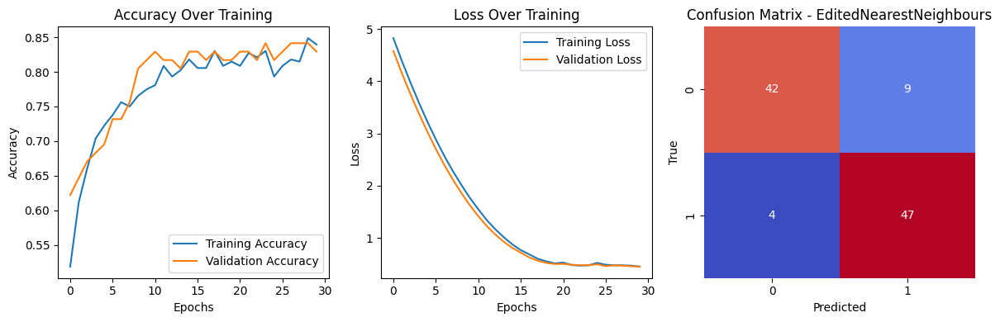


Training and Evaluating with Sampler: AllKNN
3/3 [==============================] - 0s 7ms/step


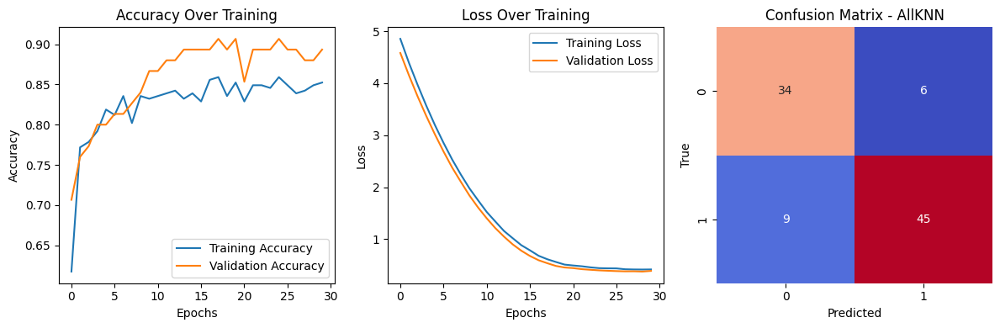


Training and Evaluating with Sampler: InstanceHardnessThreshold
4/4 [==============================] - 0s 4ms/step


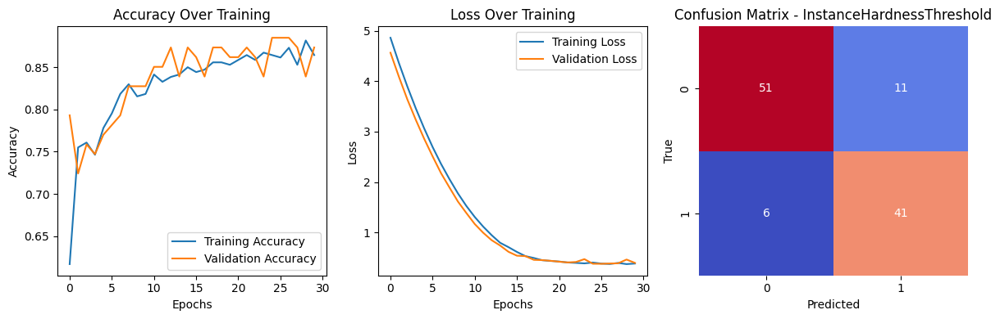


Training and Evaluating with Sampler: NearMiss
4/4 [==============================] - 1s 8ms/step


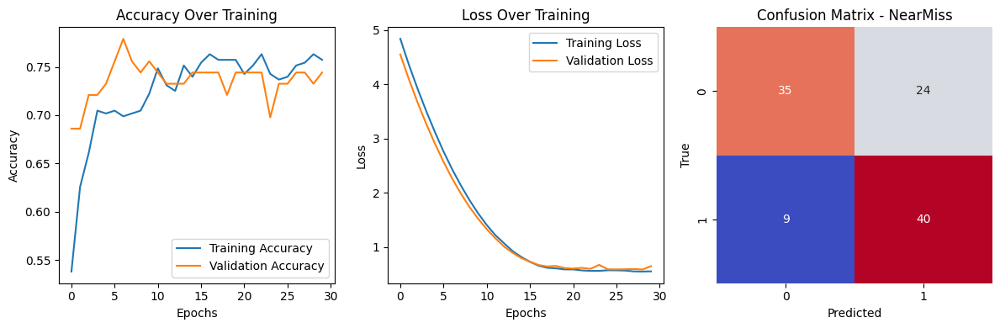


Training and Evaluating with Sampler: NeighbourhoodCleaningRule
4/4 [==============================] - 1s 5ms/step


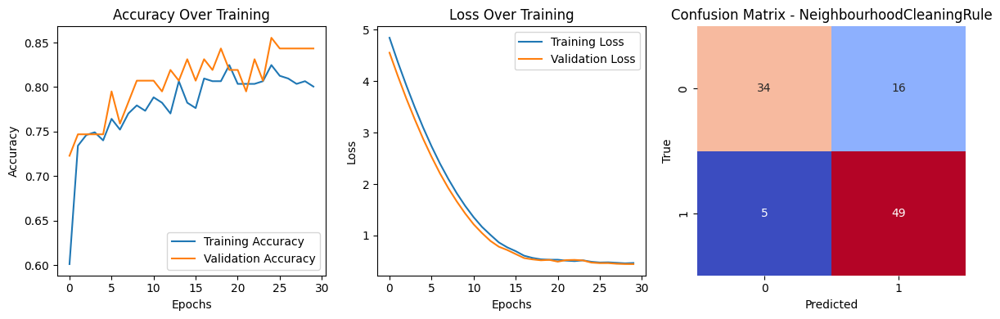


Training and Evaluating with Sampler: OneSidedSelection
5/5 [==============================] - 0s 4ms/step


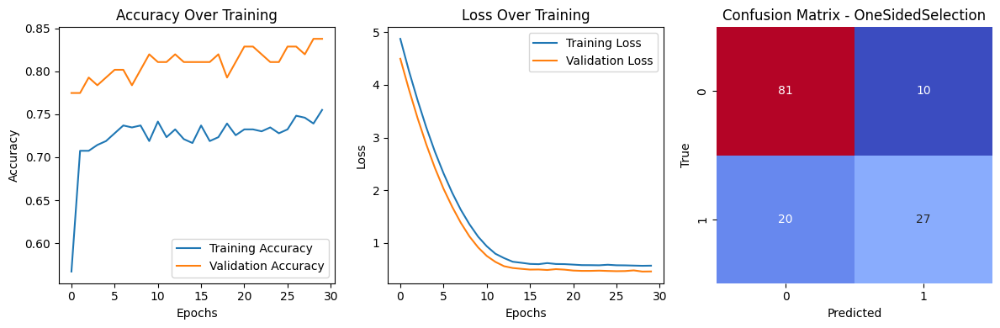


Training and Evaluating with Sampler: RandomUnderSampler
4/4 [==============================] - 1s 5ms/step


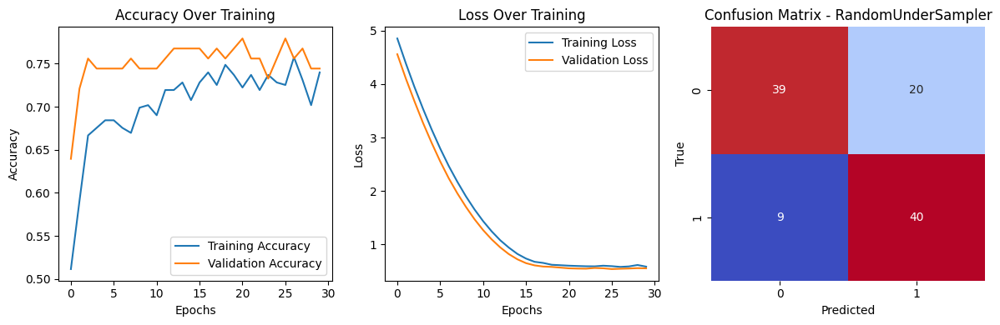


Training and Evaluating with Sampler: TomekLinks
5/5 [==============================] - 0s 5ms/step


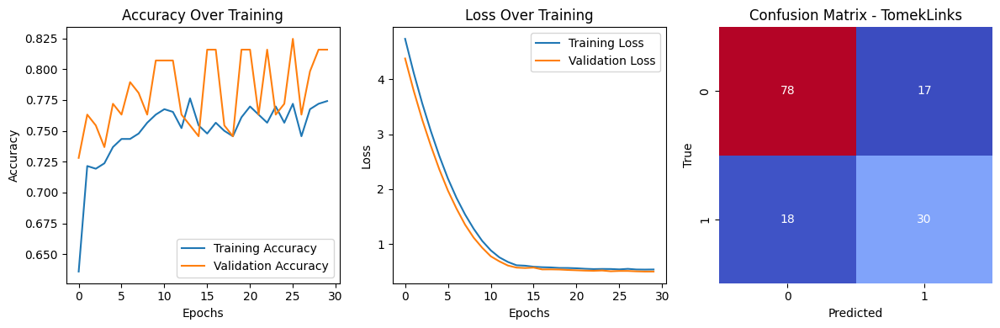

Metrics Comparison:
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7727272727272727 | 0.7380952380952381 | 0.5636363636363636 | 0.6391752577319588 |
|           SMOTE           |       0.745        | 0.7717391304347826 | 0.7029702970297029 | 0.7357512953367875 |
|        KMeansSMOTE        | 0.7761194029850746 | 0.7941176470588235 | 0.7714285714285715 | 0.782608695652174  |
|           ADASYN          | 0.7333333333333333 | 0.7586206896551724 | 0.6804123711340206 | 0.717391304347826  |
|          SVMSMOTE         |       0.775        | 0.7692307692307693 | 0.7920792079207921 | 0.7804878048780488 |
|     RandomOverSampler     |        0.73        | 0.790123456790123

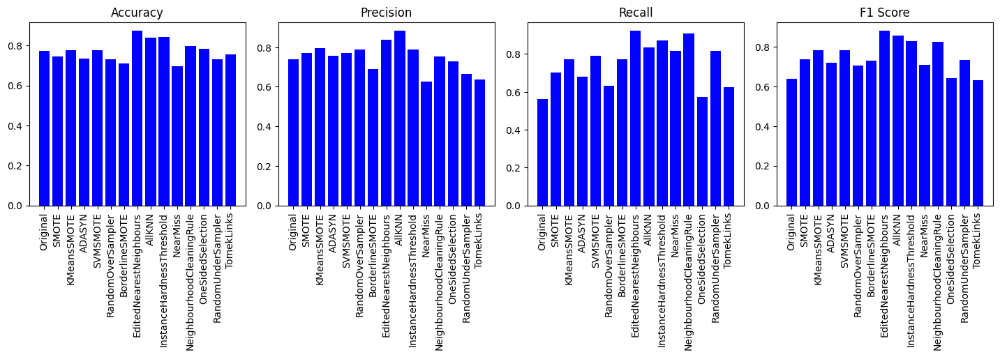

In [ ]:
#CNN + GRU
def train_evaluate_complex_network_gru(X, y, oversamplers=None, undersamplers=None, dropout_rate=0.15, l1_reg=0.01, epochs=30, batch_size=36, test_size=0.2):
    if oversamplers is None:
        oversamplers = [RandomOverSampler()]  # Default to RandomOverSampler if not provided
    if undersamplers is None:
        undersamplers = [RandomUnderSampler()]  # Default to RandomUnderSampler if not provided

    samplers = [None] + oversamplers + undersamplers  # Include original data as the first sampler

    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    for sampler in samplers:
        if sampler is None:
            X_resampled, y_resampled = X, y  # Use original data
        else:
            X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=test_size, random_state=42)

        if sampler is None:
            sampler_name = 'Original'
        else:
            sampler_name = sampler.__class__.__name__

        print(f"\nTraining and Evaluating with Sampler: {sampler_name}")
        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Reshape the input data for Conv1D
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

        # Build the model with GRU layer
        model = Sequential()
        model.add(Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)))
        model.add(MaxPooling1D(pool_size=2))
        model.add(GRU(50, kernel_regularizer=l1(l1_reg), return_sequences=True))
        model.add(Dropout(dropout_rate))
        model.add(Flatten())
        model.add(Dense(32, activation='relu'))
        model.add(Dense(1, activation='sigmoid'))
        adam = Adam(learning_rate=0.001)
        model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

        # Train the model
        history = History()
        model.fit(X_train_reshaped, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0, callbacks=[history])

        # Evaluate the model
        y_pred_probs = model.predict(X_test_reshaped)
        y_pred = (y_pred_probs > 0.5).astype(int)

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Append metrics values
        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Plot accuracy and loss during training
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot confusion matrix
        plt.subplot(1, 3, 3)
        sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler_name}')
        plt.xlabel('Predicted')
        plt.ylabel('True')

        plt.tight_layout()
        plt.show()

    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for i, sampler in enumerate(samplers):
        table.add_row([sampler.__class__.__name__ if sampler else 'Original',
                       metrics_values['Accuracy'][i],
                       metrics_values['Precision'][i],
                       metrics_values['Recall'][i],
                       metrics_values['F1 Score'][i]])

    print("Metrics Comparison:")
    print(table)
    # Plot for each metric
    plt.figure(figsize=(18, 8))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(2, 5, i)
        plt.bar([sampler.__class__.__name__ if sampler else 'Original' for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=10)

    plt.tight_layout()
    plt.show()

train_evaluate_complex_network_gru(X, y, oversamplers, undersamplers)


Training and Evaluating with Sampler: Original
5/5 [==============================] - 1s 5ms/step


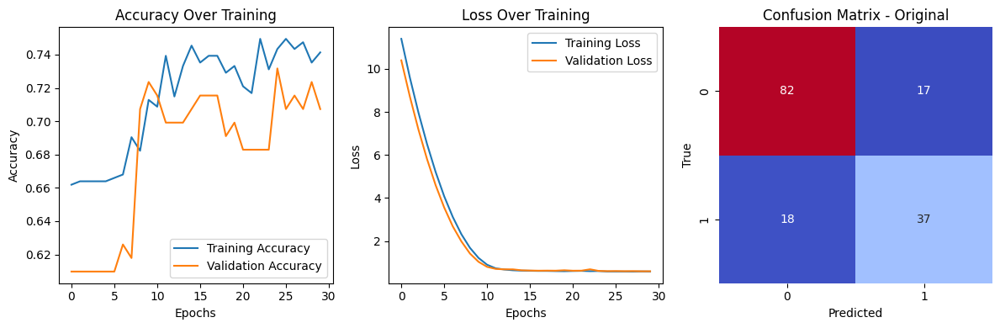


Training and Evaluating with Sampler: SMOTE
7/7 [==============================] - 1s 3ms/step


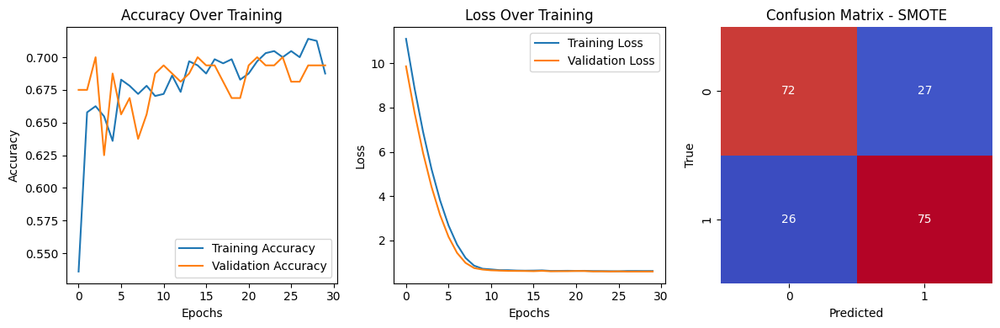

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(



Training and Evaluating with Sampler: KMeansSMOTE
7/7 [==============================] - 1s 3ms/step


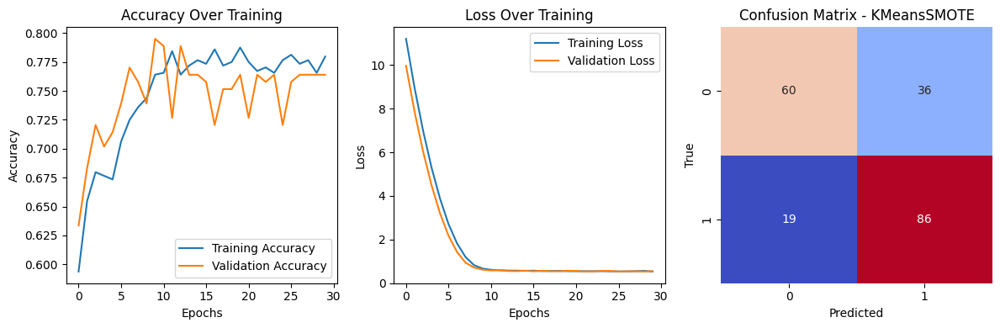


Training and Evaluating with Sampler: ADASYN
7/7 [==============================] - 1s 4ms/step


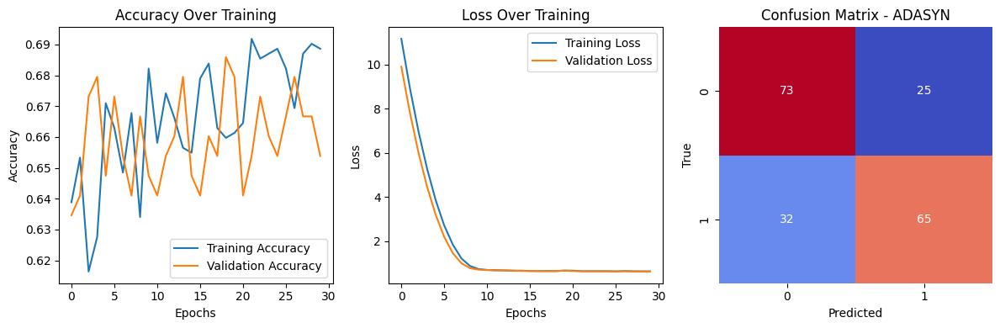


Training and Evaluating with Sampler: SVMSMOTE
7/7 [==============================] - 1s 4ms/step


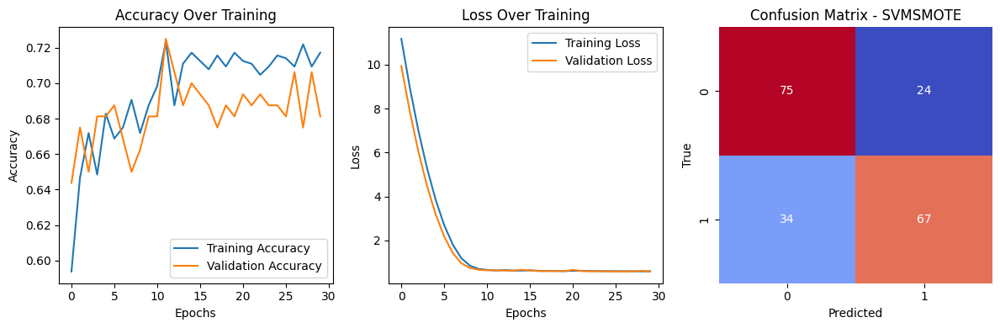


Training and Evaluating with Sampler: RandomOverSampler
7/7 [==============================] - 1s 5ms/step


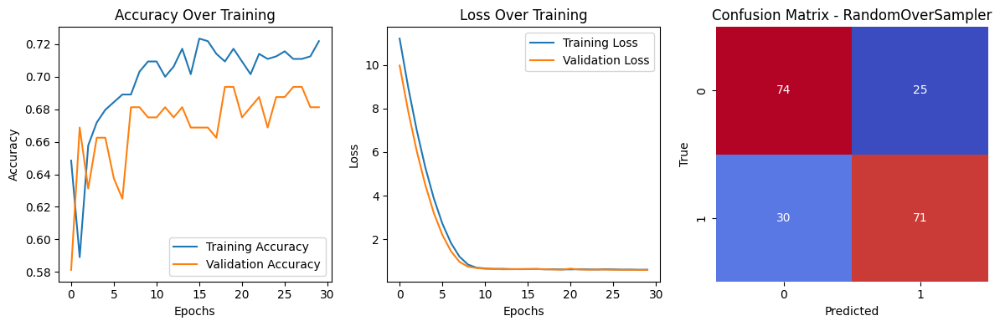


Training and Evaluating with Sampler: BorderlineSMOTE
7/7 [==============================] - 1s 4ms/step


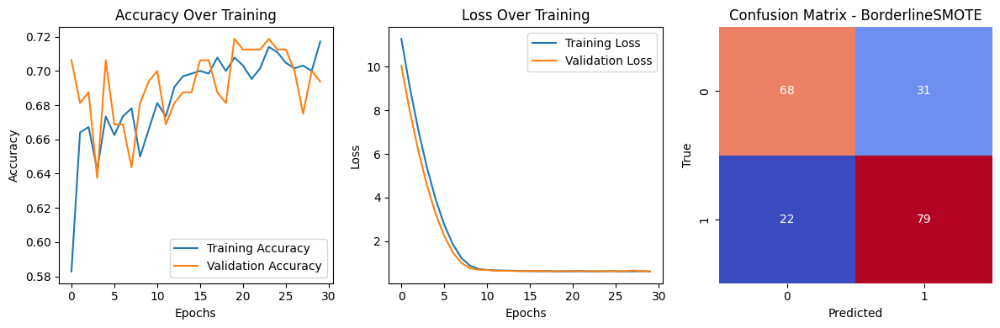


Training and Evaluating with Sampler: EditedNearestNeighbours
4/4 [==============================] - 1s 5ms/step


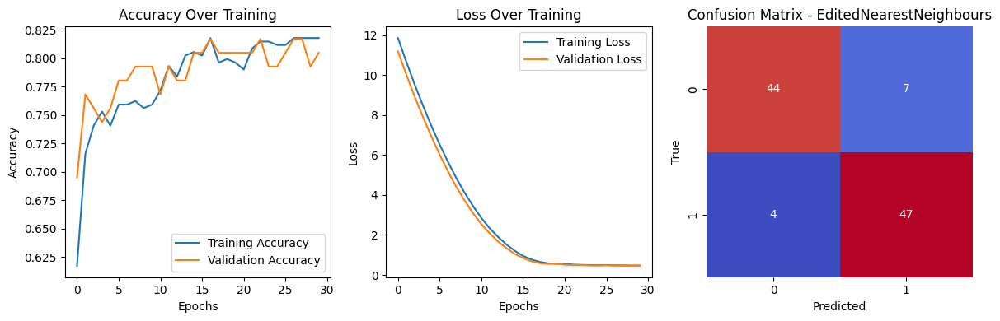


Training and Evaluating with Sampler: AllKNN
3/3 [==============================] - 1s 5ms/step


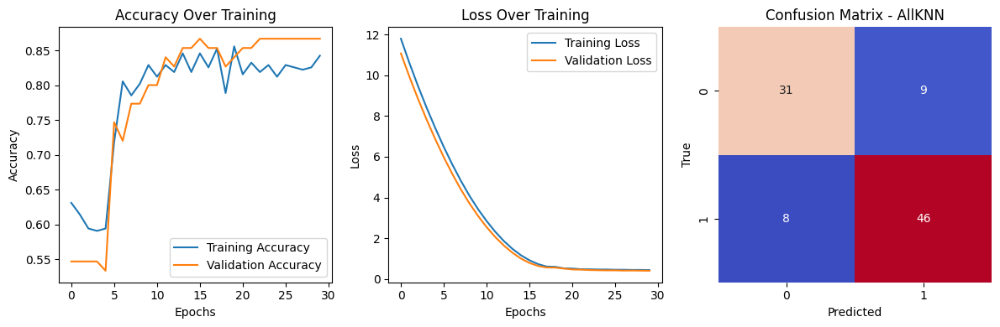


Training and Evaluating with Sampler: InstanceHardnessThreshold
4/4 [==============================] - 1s 6ms/step


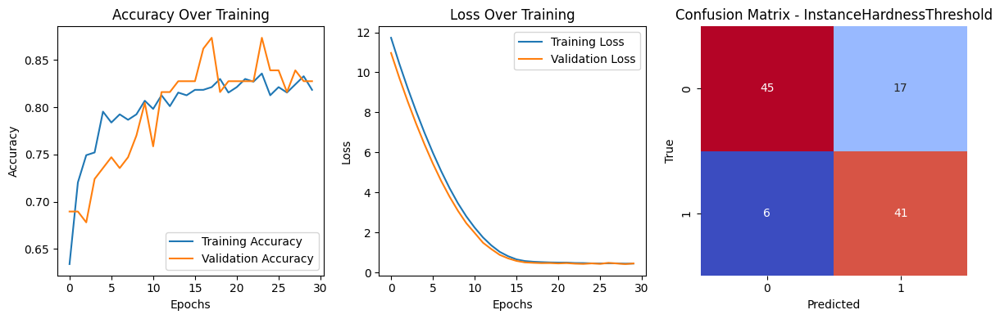


Training and Evaluating with Sampler: NearMiss
4/4 [==============================] - 1s 5ms/step


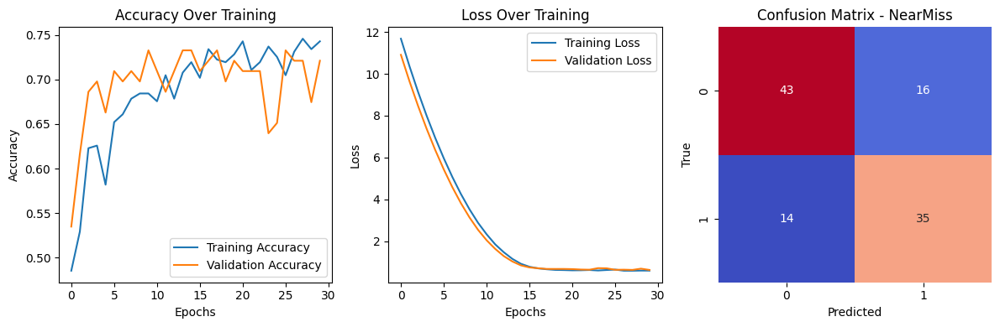


Training and Evaluating with Sampler: NeighbourhoodCleaningRule
4/4 [==============================] - 1s 5ms/step


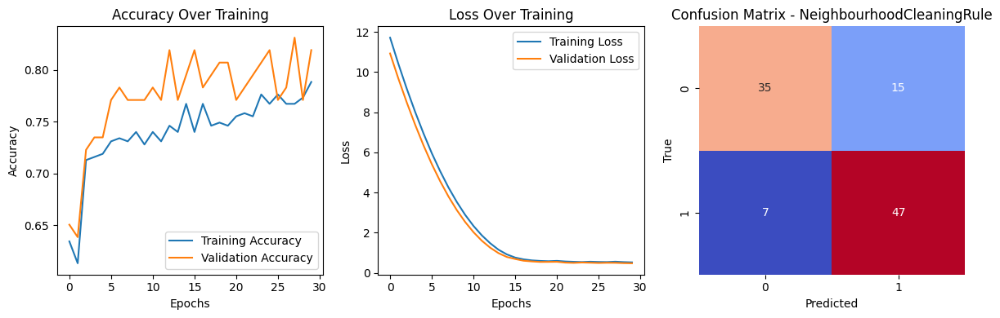


Training and Evaluating with Sampler: OneSidedSelection
5/5 [==============================] - 1s 4ms/step


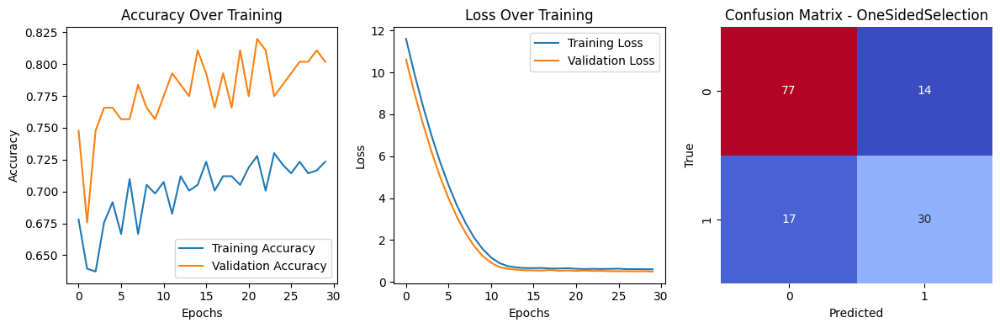


Training and Evaluating with Sampler: RandomUnderSampler
4/4 [==============================] - 1s 6ms/step


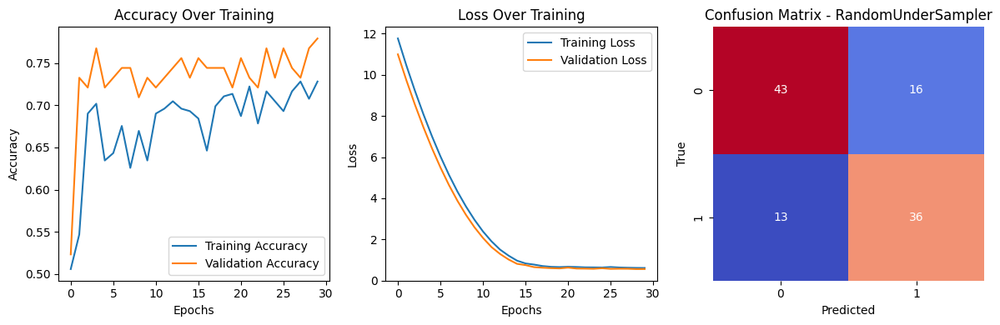


Training and Evaluating with Sampler: TomekLinks
5/5 [==============================] - 1s 5ms/step


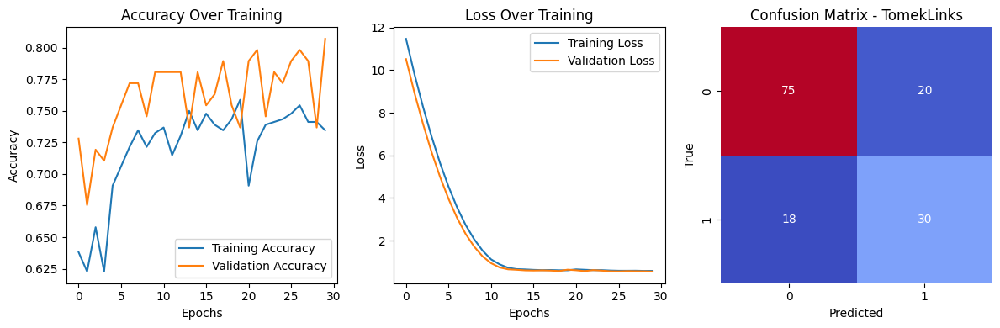

Metrics Comparison:
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Sampler          |      Accuracy      |     Precision      |       Recall       |      F1 Score      |
+---------------------------+--------------------+--------------------+--------------------+--------------------+
|          Original         | 0.7727272727272727 | 0.6851851851851852 | 0.6727272727272727 | 0.6788990825688074 |
|           SMOTE           |       0.735        | 0.7352941176470589 | 0.7425742574257426 | 0.7389162561576355 |
|        KMeansSMOTE        | 0.7263681592039801 | 0.7049180327868853 | 0.819047619047619  | 0.7577092511013216 |
|           ADASYN          | 0.7076923076923077 | 0.7222222222222222 | 0.6701030927835051 | 0.6951871657754011 |
|          SVMSMOTE         |        0.71        | 0.7362637362637363 | 0.6633663366336634 | 0.6979166666666666 |
|     RandomOverSampler     |       0.725        | 0.739583333333333

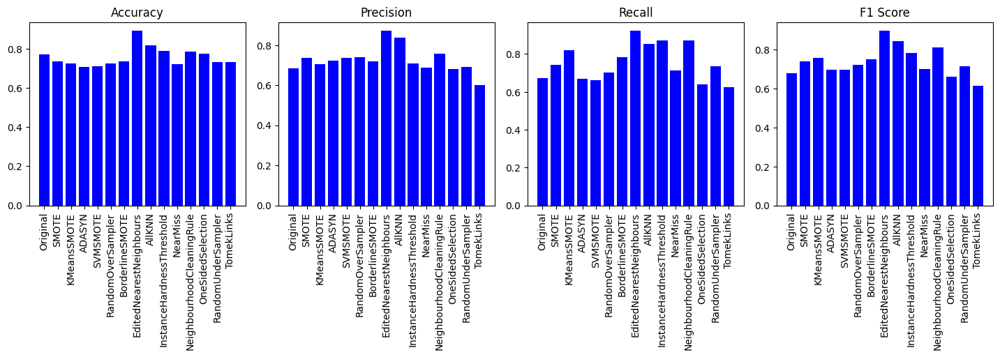

In [7]:
# CNN + LSTM + GRU
def train_evaluate_complex_network_cnn_lstm_gru(X, y, oversamplers=None, undersamplers=None, dropout_rate=0.15, l1_reg=0.01, epochs=30, batch_size=36, test_size=0.2):
    if oversamplers is None:
        oversamplers = [RandomOverSampler()]  # Default to RandomOverSampler if not provided
    if undersamplers is None:
        undersamplers = [RandomUnderSampler()]  # Default to RandomUnderSampler if not provided

    samplers = [None] + oversamplers + undersamplers  # Include original data as the first sampler

    metrics_names = ['Accuracy', 'Precision', 'Recall', 'F1 Score']
    metrics_values = {metric: [] for metric in metrics_names}

    for sampler in samplers:
        if sampler is None:
            X_resampled, y_resampled = X, y  # Use original data
        else:
            X_resampled, y_resampled = sampler.fit_resample(X, y)
        X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=test_size, random_state=42)

        if sampler is None:
            sampler_name = 'Original'
        else:
            sampler_name = sampler.__class__.__name__

        print(f"\nTraining and Evaluating with Sampler: {sampler_name}")
        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Reshape the input data for Conv1D
        X_train_reshaped = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
        X_test_reshaped = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

        # Build the model with CNN, LSTM, and GRU layers
        model = Sequential()
        model.add(Conv1D(32, kernel_size=3, activation='relu', input_shape=(X_train_reshaped.shape[1], 1)))
        model.add(MaxPooling1D(pool_size=2))
        model.add(LSTM(50, kernel_regularizer=l1(l1_reg), return_sequences=True))
        model.add(GRU(50, kernel_regularizer=l1(l1_reg), return_sequences=True))
        model.add(Dropout(dropout_rate))
        model.add(Flatten())
        model.add(Dense(32, activation='relu'))
        model.add(Dense(1, activation='sigmoid'))
        adam = Adam(learning_rate=0.001)
        model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

        # Train the model
        history = History()
        model.fit(X_train_reshaped, y_train, epochs=epochs, batch_size=batch_size, validation_split=0.2, verbose=0, callbacks=[history])

        # Evaluate the model
        y_pred_probs = model.predict(X_test_reshaped)
        y_pred = (y_pred_probs > 0.5).astype(int)

        # Calculate metrics
        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)

        # Confusion matrix
        cm = confusion_matrix(y_test, y_pred)

        # Append metrics values
        metrics_values['Accuracy'].append(accuracy)
        metrics_values['Precision'].append(precision)
        metrics_values['Recall'].append(recall)
        metrics_values['F1 Score'].append(f1)

        # Plot accuracy and loss during training
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.plot(history.history['accuracy'], label='Training Accuracy')
        plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
        plt.title('Accuracy Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()

        plt.subplot(1, 3, 2)
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.title('Loss Over Training')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()

        # Plot confusion matrix
        plt.subplot(1, 3, 3)
        sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', cbar=False)
        plt.title(f'Confusion Matrix - {sampler_name}')
        plt.xlabel('Predicted')
        plt.ylabel('True')

        plt.tight_layout()
        plt.show()

    table = PrettyTable()
    table.field_names = ['Sampler', 'Accuracy', 'Precision', 'Recall', 'F1 Score']

    for i, sampler in enumerate(samplers):
        table.add_row([sampler.__class__.__name__ if sampler else 'Original',
                       metrics_values['Accuracy'][i],
                       metrics_values['Precision'][i],
                       metrics_values['Recall'][i],
                       metrics_values['F1 Score'][i]])

    print("Metrics Comparison:")
    print(table)
    # Plot for each metric
    plt.figure(figsize=(18, 8))

    for i, metric_name in enumerate(metrics_names, start=1):
        plt.subplot(2, 5, i)
        plt.bar([sampler.__class__.__name__ if sampler else 'Original' for sampler in samplers], metrics_values[metric_name], color='blue')
        plt.title(metric_name)
        plt.xticks(rotation='vertical')
        plt.tick_params(axis='both', which='major', labelsize=10)

    plt.tight_layout()
    plt.show()


train_evaluate_complex_network_cnn_lstm_gru(X, y, oversamplers, undersamplers)